In [1]:
import folium
import warnings
from geopy.geocoders import Nominatim
warnings.filterwarnings('ignore')
from geopy import distance
import pandas as pd
import numpy as np
from matplotlib.pyplot import *
import geopandas as gpd

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression

### Задача:

Прогноз продаж одной из популярных моделей [фичерфонов](https://ru.wikipedia.org/wiki/%D0%A4%D0%B8%D1%87%D0%B5%D1%80%D1%84%D0%BE%D0%BD) (на картинке ниже пример похожего устройства) в салонах МегаФона
![](https://39.img.avito.st/640x480/8468720439.jpg)

### Исходные данные:

Датасет содержит следующие поля:

1. `point_id` - Индентификатор салона
2. `lon` - Долгота точки
3. `lat` - Широта точки
4. `target` - Значение таргета, усредненное за несколько месяцев и отнормированное

### Требования к решению и советы:

Ниже приведен список из нескольких важных пунктов, необходимых для решения задания. Выполнение каждого из пунктов влияет на итоговую оценку. Вы можете выполнить каждый из пунктов разными способами, самым лучшим будет считаться вариант, когда всё получение и обработка данных будут реализованы на Питоне (пример: вы можете скачать данные из OSM через интерфейс на сайте overpass-turbo или с помощью библиотек `overpass`/`requests`. Оба варианта будут зачтены, но больше баллов можно заработать во втором случае)



1. Салоны расположены в нескольких разных городах, вам необходимо **определить город для каждого салона** (это понадобится во многих частях задания). К этому есть разные подходы. Вы можете провести [обратное геокодирование](https://en.wikipedia.org/wiki/Reverse_geocoding) с помощью геокодера [Nominatim](https://nominatim.org/), доступного через библиотеку `geopy` примерно вот так:
```python
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="specify_your_app_name_here")
location = geolocator.reverse("52.509669, 13.376294")
print(location.address)
```
В таком случае, вам придется обрабатывать полученную строку адреса, чтобы извлечь название города. Также вы можете скачать из OSM или найти в любом другом источнике границы административно территориальных границ России и пересечь с ними датасет с помощью `geopandas.sjoin` (этот вариант более надежный, но нужно будет разобраться с тем, как устроены границы АТД в OSM, обратите внимание на [этот тег](https://wiki.openstreetmap.org/wiki/Key:admin_level))



2. **Используйте данные OSM**: подумайте, какие объекты могут влиять на продажи фичерфонов. Гипотеза: такие телефоны покупают люди, приезжающие в город или страну ненадолго, чтобы вставить туда отдельную симкарту для роуминга. Можно попробовать использовать местоположения железнодорожных вокзалов (изучите [этот тег](https://wiki.openstreetmap.org/wiki/Tag:railway%3Dstation)). Необходимо использовать хотя бы 5 разных типов объектов из OSM. Скорее всего, вам придется качать данные OSM отдельно для разных городов (см. пример для Нью-Йорка из лекции)


3. **Используйте разные способы генерации признаков**: описать положение салона МегаФона относительно станций метро можно разными способами - найти ***расстояние до ближайшей станции***, или же посчитать, сколько станций попадает в ***500 метровую буферную зону*** вокруг салона. Такие признаки будут нести разную информацию. Так же попробуйте поэкспериментировать с размерами буферных зон (представьте, что значат в реальности радиусы 100, 500, 1000 метров). Попробуйте посчитать расстояние до центра города, до других объектов.

4. **Сделайте визуализации**: постройте 2-3 карты для какого нибудь из городов - как распределен в пространстве таргет, где находятся объекты, полученные вами из OSM. Можете использовать любой инструмент - обычный `plot()`, `folium`, `keplergl`. Если выберете Кеплер, обязательно сохраните в файл конфиг карты, чтобы ее можно было воспроизвести. Сделать это можно вот так:

```python
import json
json_data = kepler_map.config
with open('kepler_config.json', 'w') as outfile:
    json.dump(json_data, outfile)
```
5. Задание не ограничено приведенными выше пунктами, попробуйте нагенерировать интересных признаков, найти в интернете дополнительные данные (в таком случае в комментарии к коду укажите ссылку на ресурс, откуда взяли данные)



6. Это довольно сложная задача - датасет очень маленький, данные по своей природе довольно случайны. Поэтому место и скор на Kaggle не будут играть решающую роль в оценке, но позволят заработать дополнительные баллы

### Read data

In [ ]:
#сразу должен предупредить, что ячейки с запросами могут выполняться не сразу, так как то ли google, то ли overpass 
#может быть недооволен таким большим количеством запросов за короткий промежуток времени
#так что по несколько раз такие ячейки лучше не запускать

In [2]:
train = pd.read_csv('data/mf_geo_train.csv')
test = pd.read_csv('data/mf_geo_test.csv')

In [3]:
train.head(2)

t = pd.concat([train, test], ignore_index=True, sort=False)


In [4]:
test

,point_id,lon,lat,target
0,F4lXR1cG,37.681242,55.748040,0.0091
1,4LJu4GTf,60.580910,56.795860,0.0091
2,kLuAAN3s,37.598614,55.781357,0.0091
3,OxQHvaNu,37.794051,55.717468,0.0091
4,paQsTa1K,49.213026,55.748290,0.0091
...,...,...,...,...
102,y8oQuX5v,30.353777,60.049792,0.0091
103,4nmfqUw0,92.928927,56.116262,0.0091
104,N9O45mAh,93.015993,56.023697,0.0091
105,h2InCLKa,30.381172,59.871149,0.0091


In [5]:
points = t.apply(lambda tup: (tup['lat'], tup['lon']), axis=1)
  
points


0      (55.84863000000001, 37.590776)
1               (55.750271, 37.78421)
2               (47.21333, 39.635721)
3                (55.78202, 37.70457)
4              (55.730188, 37.643983)
                    ...              
527            (60.049792, 30.353777)
528            (56.116262, 92.928927)
529            (56.023697, 93.015993)
530            (59.871149, 30.381172)
531             (59.94211, 30.279244)
Length: 532, dtype: object

In [6]:
from overpass import *
import requests
url = "http://overpass-api.de/api/interpreter"
overpass_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
node["place"="city"](area);
out;

"""
response = requests.get(url, 
                        params={'data': overpass_query})
data = response.json()
#качаю данные с помощью overpass, кажется, я неплох

In [7]:
data

{'version': 0.6,
 'generator': 'Overpass API 0.7.56.8 7d656e78',
 'osm3s': {'timestamp_osm_base': '2020-12-09T10:24:02Z',
  'timestamp_areas_base': '2020-12-09T09:26:03Z',
  'copyright': 'The data included in this document is from www.openstreetmap.org. The data is made available under ODbL.'},
 'elements': [{'type': 'node',
   'id': 54,
   'lat': 55.0282171,
   'lon': 82.9234509,
   'tags': {'admin_level': '3',
    'name': 'Новосибирск',
    'name:ar': 'نوفوسيبيرسك',
    'name:be': 'Новасібірск',
    'name:ca': 'Novossibirsk',
    'name:cs': 'Novosibirsk',
    'name:da': 'Novosibirsk',
    'name:de': 'Nowosibirsk',
    'name:en': 'Novosibirsk',
    'name:es': 'Novosibirsk',
    'name:et': 'Novosibirsk',
    'name:fi': 'Novosibirsk',
    'name:fr': 'Novossibirsk',
    'name:he': 'נובוסיבירסק',
    'name:hi': 'नोवोसिबिर्स्क',
    'name:hr': 'Novosibirsk',
    'name:ja': 'ノヴォシビルスク',
    'name:kn': 'ನೋವೋಸಿಬಿರ್ಸ್ಕ್',
    'name:ko': '노보시비르스크',
    'name:lt': 'Novosibirskas',
    'name:lv': 

In [8]:
i = 0
c = []
for cities in data['elements']:
    print(cities['tags']['name:ru'])
    c.append(cities['tags']['name:ru'])
    i += 1
print(i)

towns = pd.Series(c)
print(towns)


#все города из датафрейма
    

Новосибирск
Северодвинск
Петрозаводск
Вологда
Тверь
Великий Новгород
Пушкин
Псков
Калининград
Великие Луки
Смоленск
Брянск
Курск
Орёл
Белгород
Евпатория
Санкт-Петербург
Владивосток
Екатеринбург
Самара
Омск
Казань
Челябинск
Уфа
Волгоград
Пермь
Саратов
Воронеж
Тольятти
Краснодар
Ярославль
Барнаул
Иркутск
Новокузнецк
Оренбург
Рязань
Пенза
Тюмень
Нижний Новгород
Таганрог
Сочи
Тула
Назрань
Нижний Тагил
Воркута
Ставрополь
Колпино
Липецк
Воткинск
Новороссийск
Обнинск
Нальчик
Энгельс
Киров
Долгопрудный
Химки
Рыбинск
Кострома
Иваново
Электросталь
Ногинск
Пятигорск
Ростов-на-Дону
Томск
Красноярск
Курган
Череповец
Черкесск
Йошкар-Ола
Майкоп
Махачкала
Элиста
Сыктывкар
Саранск
Якутск
Кызыл
Петропавловск-Камчатский
Владимир
Южно-Сахалинск
Тамбов
Нарьян-Мар
Ханты-Мансийск
Биробиджан
Набережные Челны
Волжский
Сургут
Комсомольск-на-Амуре
Стерлитамак
Братск
Дзержинск
Шахты
Ангарск
Нижневартовск
Прокопьевск
Норильск
Армавир
Златоуст
Каменск-Уральский
Новочеркасск
Королёв
Находка
Волгодонск
Березники
Рубц

In [9]:
geolocator = Nominatim(user_agent="my_angel2")
lat = t.lat
lon = t.lon


k = 0
s = []
s1 = []
print("hey")
for i, j in zip(lon, lat):
    try:
        location = geolocator.reverse([j, i])
    except:
        print("Connection refused by the server..")
        print("Let me sleep for 5 seconds")
        print("ZZzzzz...")
        time.sleep(5)
        print("Was a nice sleep, now let me continue...")
        try:
            location = geolocator.reverse([j, i])
        except:
            print("Connection refused by the server..")
            print("Let me sleep for 5 seconds")
            print("ZZzzzz...")
            time.sleep(5)
            print("Was a nice sleep, now let me continue...")
            location = geolocator.reverse([j, i])
       

    k += 1
    s = str(location).split(",")
    print(location)
    print(k)

    for i in s:
        
        i = i.strip()
       

        if i in c:
            s1.append(i)
            break
        if i.split()[0] == 'городской':
            s1.append(i.split()[2])
            break
            
    

cities_s = pd.Series(s1)

print("fin")
lat = t.lat
lon = t.lon


        
 
        
      
        
        

    
#тут у нас проблемы с количеством запросов на сервер, мы немного вызываем у него подозрения с такой частотой запросов
#я установил try-блок, чтобы сервер не отказывал нам (кстати данный блок работает долго, если что)  
#немного костыльное решение к try-блоком, обрабатывается два исключения от сервера подряд, три подряд у меня не приходило, но если вдруг придут, то нужно перезапустить
#короче аккуратнее с этой ячейкой, но всё должно работать
#кстати, ячейка будет долго выполняться, можно сделать чай
#в любом случае эту ячейку лучше запускать минимальное кол-во раз, потому что потом сервер всё меньше и меньше нам доверяет
#если запускать несколько раз, то стоит менять имя user_agent
    


    


hey
6А, Сигнальный проезд, район Отрадное, Москва, Центральный федеральный округ, 127106, Россия
1
38/18, 2-я Владимирская улица, Новогиреево, район Новогиреево, Москва, Центральный федеральный округ, 4А, Россия
2
18, улица Зорге, ЗЖМ, Советский район, Ростов-на-Дону, городской округ Ростов-на-Дону, Ростовская область, Южный федеральный округ, 344000, Россия
3
Торговый центр "Серебряный Дом", 16, Большая Семёновская улица, Семёновское, район Соколиная Гора, Москва, Центральный федеральный округ, 105094, Россия
4
5, Кожевническая улица, район Замоскворечье, Москва, Центральный федеральный округ, 115280, Россия
5
12, улица 9 Мая, Северный, 3-ий микрорайон, Советский район, Красноярск, городской округ Красноярск, Красноярский край, Сибирский федеральный округ, 660000, Россия
6
Ледовый дворец, 1, проспект Пятилеток, округ Правобережный, Санкт-Петербург, Северо-Западный федеральный округ, 193318, Россия
7
Торгово-развлекательный центр "Калейдоскоп", 56, Сходненская улица, район Южное Тушино

3 с3, Кронштадтский бульвар, Головинский, Головинский район, Москва, Центральный федеральный округ, 125212, Россия
61
16, улица Вайнера, Кольцо Екатерины, Ленинский район, Екатеринбург, городской округ Екатеринбург, Свердловская область, Уральский федеральный округ, 620077, Россия
62
133, Красноармейская улица, Шмидта, Железнодорожный район, городской округ Самара, Самарская область, Приволжский федеральный округ, 443028, Россия
63
27, улица Академика Королёва, Сипайлово, Октябрьский район, Уфа, городской округ Уфа, Башкортостан, Приволжский федеральный округ, 450000, Россия
64
Мегафон, проспект Большевиков, Невский округ, Санкт-Петербург, Северо-Западный федеральный округ, 190000, Россия
65
Мегафон, улица Татарстан, Старо-Татарская слобода, Вахитовский район, городской округ Казань, Татарстан, Приволжский федеральный округ, 420021, Россия
66
167, улица Фрунзе, Ягодная слобода, Кировский район, городской округ Казань, Татарстан, Приволжский федеральный округ, 420033, Россия
67
Кировски

Дочки-сыночки, 90, улица Юлиуса Фучика, Азино-2, Советский район, городской округ Казань, Татарстан, Приволжский федеральный округ, 420140, Россия
122
ТРЦ Галерея Новосибирск, 13, улица Гоголя, Центральный район, городской округ Новосибирск, Новосибирская область, Сибирский федеральный округ, 630091, Россия
123
87, улица Металлургов, Верх-Исетский район, Екатеринбург, городской округ Екатеринбург, Свердловская область, Уральский федеральный округ, 620043, Россия
124
ТРК «Международный», 3, улица Белы Куна, округ Купчино, Санкт-Петербург, Северо-Западный федеральный округ, 190000, Россия
125
31, Русаковская улица, Сокольники, район Сокольники, Москва, Центральный федеральный округ, 101113, Россия
126
ТК Пик, 2, улица Ефимова, Сенной округ, Санкт-Петербург, Северо-Западный федеральный округ, 190031, Россия
127
Торгово-развлекательный центр "Океания", 57, Кутузовский проспект, Давыдково, район Фили-Давыдково, Москва, Центральный федеральный округ, 121352, Россия
128
РИО, 1, Большая Черёму

Decathlon, 5, Е-Ж, Крутые ключи, Красноглинский район, городской округ Самара, Самарская область, Приволжский федеральный округ, 443028, Россия
179
26, улица Ленина, Кировский район, Уфа, городской округ Уфа, Башкортостан, Приволжский федеральный округ, 450000, Россия
180
Торгово-развлекательный центр "Речной", 2Б, Фестивальная улица, район Левобережный, Москва, Центральный федеральный округ, 125195, Россия
181
Avenue Southwest, 86А, проспект Вернадского, Тропарёво, Тропарёво-Никулино, Москва, Центральный федеральный округ, 117571, Россия
182
ТК «Невский», 18, проспект Большевиков, округ Оккервиль, Санкт-Петербург, Северо-Западный федеральный округ, 190000, Россия
183
Торговый центр «Ока», 8, Октябрьская улица, Простоквашино, Колпино, Санкт-Петербург, Северо-Западный федеральный округ, 196655, Россия
184
45, улица 60 лет Октября, Свердловский район, Красноярск, городской округ Красноярск, Красноярский край, Сибирский федеральный округ, 660000, Россия
185
72А, улица Юлиуса Фучика, Горки

184, Невский проспект, Пески, округ Смольнинское, Санкт-Петербург, Северо-Западный федеральный округ, 190000, Россия
240
Галерея Водолей, 15, Ореховый бульвар, район Орехово-Борисово Южное, Москва, Центральный федеральный округ, 115563, Россия
241
26, Варшавское шоссе, Нагорный район, Москва, Центральный федеральный округ, 117105, Россия
242
Торгово-развлекательный центр "Браво", 26 к2, улица Борисовские Пруды, Братеево, район Братеево, Москва, Центральный федеральный округ, 115612, Россия
243
Вива Лэнд, 147, проспект Кирова, Кировский район, городской округ Самара, Самарская область, Приволжский федеральный округ, 443028, Россия
244
Мега, 27 с78, проспект им. газеты Красноярский Рабочий, Каменный квартал, Ленинский район, Красноярск, городской округ Красноярск, Красноярский край, Сибирский федеральный округ, 660004, Россия
245
25, Бакалинская улица, Советский район, Уфа, городской округ Уфа, Башкортостан, Приволжский федеральный округ, 450022, Россия
246
Главный вокзал, 1/2, Привокзал

Роял Парк, 101, Красный проспект, Заельцовский район, городской округ Новосибирск, Новосибирская область, Сибирский федеральный округ, 630105, Россия
298
Мегафон, проспект Просвещения, 1-е Парголово, округ Шувалово-Озерки, Санкт-Петербург, Северо-Западный федеральный округ, 190000, Россия
299
Транспортно-пересадочный узел "Планерная", 7, Планерная улица, Алёшкино, район Северное Тушино, Москва, Центральный федеральный округ, 125480, Россия
300
107, улица Авроры, Советский район, городской округ Самара, Самарская область, Приволжский федеральный округ, 443076, Россия
301
4, Лобненская улица, Дмитровский, Дмитровский район, Москва, Центральный федеральный округ, 127411, Россия
302
ТРЦ Талер, 33, улица Зорге, ЗЖМ, Советский район, Ростов-на-Дону, городской округ Ростов-на-Дону, Ростовская область, Южный федеральный округ, 344000, Россия
303
Samsung, 46, улица 8 Марта, Кольцо Екатерины, Ленинский район, Екатеринбург, городской округ Екатеринбург, Свердловская область, Уральский федеральный

18, 3-й Крутицкий переулок, Таганский район, Москва, Центральный федеральный округ, 109044, Россия
359
8, Сибирский тракт, Октябрьский городок, Царицыно, Советский район, Казань, Татарстан, Приволжский федеральный округ, 420029, Россия
360
Автозаводский универмаг, 2А, проспект Октября, Автозаводский район, Нижний Новгород, городской округ Нижний Новгород, Нижегородская область, Приволжский федеральный округ, 603004, Россия
361
100, Первомайская улица, Первомайский район, городской округ Новосибирск, Новосибирская область, Сибирский федеральный округ, 630080, Россия
362
Торговые ряды, 2 с2, Новоясеневский проспект, район Ясенево, Москва, Центральный федеральный округ, 117574, Россия
363
Еврочехол, 11Б, улица Рихарда Зорге, Танкодром, Советский район, городской округ Казань, Татарстан, Приволжский федеральный округ, 420087, Россия
364
Торговый центр "Капитолий", 6, проспект Вернадского, район Раменки, Москва, Центральный федеральный округ, 119311, Россия
365
5 к11, Открытое шоссе, район 

31 с3, Пятницкая улица, Садовники, район Замоскворечье, Москва, Центральный федеральный округ, 115184, Россия
421
2/18, Бутырская улица, Бутырский район, Москва, Центральный федеральный округ, 127015, Россия
422
33/2 с1, Бауманская улица, Бауманка, Басманный район, Москва, Центральный федеральный округ, 105005, Россия
423
6, Кустанайская улица, Зябликово, район Зябликово, Москва, Центральный федеральный округ, 115682, Россия
424
Торговый центр "Март", 17А, Большая Семёновская улица, Семёновское, район Соколиная Гора, Москва, Центральный федеральный округ, 105094, Россия
425
Торговый дом "Золоторожский", площадь Рогожская Застава, Таганский район, Москва, Центральный федеральный округ, 109316, Россия
426
Кит, 65, улица Амундсена, Юго-Западный, Ленинский район, Екатеринбург, городской округ Екатеринбург, Свердловская область, Уральский федеральный округ, 620146, Россия
427
23, Новослободская улица, Сущёво, Тверской район, Москва, Центральный федеральный округ, 127006, Россия
428
75 к3, Р

Бургер кит, 12, Болотниковская улица, Нагорный район, Москва, Центральный федеральный округ, 117149, Россия
482
Удельный рынок, Фермское шоссе, Коломяги, округ Коломяги, Санкт-Петербург, Северо-Западный федеральный округ, 197341, Россия
483
Торговый центр "Клён", 14, Староватутинский проезд, Бабушкинский район, Москва, Центральный федеральный округ, 129281, Россия
484
ТРЦ PARK HOUSE, 81А, Московское шоссе, Промышленный район, городской округ Самара, Самарская область, Приволжский федеральный округ, 443110, Россия
485
Мега, 107, улица Ватутина, Кировский район, городской округ Новосибирск, Новосибирская область, Сибирский федеральный округ, 630024, Россия
486
Военвед, 151, Таганрогская улица, Октябрьский район, Ростов-на-Дону, городской округ Ростов-на-Дону, Ростовская область, Южный федеральный округ, 344016, Россия
487
39 с2, Шипиловский проезд, район Орехово-Борисово Северное, Москва, Центральный федеральный округ, 115569, Россия
488
16, улица Маршала Бирюзова, Октябрьское поле, райо

In [10]:
print(cities_s)
t['cities'] = cities_s


0               Москва
1               Москва
2       Ростов-на-Дону
3               Москва
4               Москва
            ...       
527    Санкт-Петербург
528         Красноярск
529         Красноярск
530    Санкт-Петербург
531    Санкт-Петербург
Length: 532, dtype: object


In [11]:
def closest(points, coors):
    c_dist_curr = []
    c_dist = []
    print("hey")
    for p in points:
        for c in coors:
            c_dist_curr.append(distance.great_circle(c, p).km)


        c_dist.append(min(c_dist_curr))


        c_dist_curr.clear()
    return c_dist
    

In [12]:
def counter_am(points, coors, radius):
    c_num = []
    c_curr = 0
    for p in points:
        for c in coors:
            if distance.geodesic(c, p).km < radius:
                c_curr += 1

       
        c_num.append(c_curr)
        c_curr = 0
    return c_num
  



In [13]:
#если некоторые ячейки с запросами будут падать, то их нужно просто перезапустить
#это всё так же проблемы с http
#вмкашный курс "Компьютерные сети" проводит разведку в ML

railway_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["railway"="station"](area);
 way["railway"="station"](area);
 rel["railway"="station"](area);
);
out;

"""
railway_response = requests.get(url, 
                        params={'data': railway_query})
railway_data = railway_response.json()
#можно было сделать более изящно, и загрузить ж/д станции для каждого из городов, но городов в датафрейме не так уж и мало,
#поэтому я решил загрузить всю Россию, что конечно и сказалось на производительности, но зато намного проще в плане понимания, так как не надо перебирать каждый из городов
#а ещё в лекции было сказано, что для России не длях всех городов есть такие данные в открытом доступе

In [14]:
rl_coors = []
for rl in railway_data['elements']:
  
    rl_coors.append((rl['lat'], rl['lon']))
    
print(rl_coors)
    


[(60.7493828, 33.7111717), (60.6222059, 33.3142519), (59.9904636, 30.3547672), (59.9882032, 30.4250102), (61.9411125, 34.250394), (63.1510252, 34.3017338), (59.9581823, 30.3581566), (58.584182, 29.6126013), (58.5084726, 29.4797692), (58.6119761, 30.8343846), (58.6666759, 30.0149672), (58.6480715, 30.314861), (59.926932, 30.3631131), (59.9188141, 30.3307149), (58.5521323, 31.2331074), (60.039202, 30.2964601), (59.9090382, 30.3874886), (60.1043173, 30.2186217), (60.0505496, 30.4423808), (63.5218683, 34.2682131), (63.4377338, 34.2441439), (62.0644662, 34.2309908), (62.3623541, 34.4879374), (62.2993044, 34.5167109), (62.2605461, 34.4488653), (62.6740809, 34.2692852), (62.2093216, 34.2761655), (62.1117266, 34.2434397), (62.9085547, 34.4493238), (60.8377678, 33.9894297), (60.9020304, 34.06936), (55.7788343, 37.6537207), (55.9496529, 37.2990008), (59.7230316, 30.4296924), (59.4259563, 30.6480881), (58.2660054, 29.1113467), (58.4233012, 29.3629632), (57.3544041, 28.3169775), (56.0613901, 29.92

In [15]:

nursing_home_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["amenity"="nursing_home"](area);
 way["amenity"="nursing_home"](area);
 rel["amenity"="nursing_home"](area);
);
out;

"""
nursing_home_response = requests.get(url, 
                        params={'data': nursing_home_query})
nursing_home_data = nursing_home_response.json()

#кнопочные телефоны могут быть также востребованы среди людей пожилого возраста, так что недалеко от домов престарелых
#их могут покупать больше, особенно учитвая, что и пожилых людей могут быть проблемы со зрением, и тогда кнопочный телефон - единственный варинат для них

nursing_coors = []
for ns in nursing_home_data['elements']:
  
    nursing_coors.append((ns['lat'], ns['lon']))
    
print(nursing_coors)




[(48.3338137, 40.2547942), (55.6707049, 60.6519597), (51.7548076, 36.1462091), (57.8573515, 37.2559451), (58.420067, 33.3088956), (43.8005163, 131.9562968), (51.201619, 36.2906034), (53.386029, 58.8488641), (54.3596959, 48.532981), (50.3585664, 41.0018373), (44.3838268, 43.8595047), (58.1847923, 51.0439123), (52.9534782, 45.6277294), (58.0577111, 56.2820566), (47.5655869, 46.7181833), (54.0708446, 34.3359307), (51.5317818, 46.0306605), (55.0728381, 57.5547264), (48.0189514, 39.8834839), (55.0885486, 73.1389804), (55.6300609, 43.2158946), (52.3480669, 55.4998197), (52.3646171, 55.5730678), (55.9162717, 102.9381421), (44.5185724, 40.0992821), (58.5415537, 31.2330623), (56.9867123, 60.4638884), (54.3000837, 155.9487718), (44.7434322, 132.0510519), (56.8808636, 60.5060235), (56.8075329, 60.5012798), (56.1125625, 36.2148909), (56.2057314, 92.6691203), (56.8048009, 60.5016527), (64.7336773, 38.4400464), (54.0647495, 34.3707923), (55.7358724, 49.1442114), (55.676614, 49.137627), (46.7965397, 

In [17]:

url1 = "http://overpass-api.de/api/interpreter"
mall_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["shop"="mall"](area);
);
out;

"""
mall_response = requests.get(url, 
                        params={'data': mall_query})
print(mall_response.text)
mall_data = mall_response.json()



mall_coors = []
for ml in mall_data['elements']:
  
    mall_coors.append((ml['lat'], ml['lon']))
    

#рядом с торговыми центрами всегда много людей, увеличив продажи всех телефонов, мы увеличим и продажи конкретно кнопочных
#гипотеза оказалась неверна (ошибка второго рода), так что не будем использовать эту фичу



{
  "version": 0.6,
  "generator": "Overpass API 0.7.56.8 7d656e78",
  "osm3s": {
    "timestamp_osm_base": "2020-12-09T10:48:03Z",
    "timestamp_areas_base": "2020-12-09T10:34:02Z",
    "copyright": "The data included in this document is from www.openstreetmap.org. The data is made available under ODbL."
  },
  "elements": [

{
  "type": "node",
  "id": 310752865,
  "lat": 55.6046219,
  "lon": 37.7123014,
  "tags": {
    "name": "Белград",
    "shop": "mall"
  }
},
{
  "type": "node",
  "id": 356058145,
  "lat": 60.3521446,
  "lon": 29.4406646,
  "tags": {
    "operator": "Пятёрочка",
    "shop": "mall"
  }
},
{
  "type": "node",
  "id": 370228123,
  "lat": 53.3865733,
  "lon": 58.9788084,
  "tags": {
    "addr:city": "Магнитогорск",
    "addr:housenumber": "135",
    "addr:postcode": "455038",
    "addr:street": "проспект Карла Маркса",
    "name": "Максимус",
    "shop": "mall"
  }
},
{
  "type": "node",
  "id": 370228223,
  "lat": 53.4302916,
  "lon": 58.9732198,
  "tags": {
    "

In [18]:
url2 = "http://overpass-api.de/api/interpreter"
school_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["amenity"="school"](area);
 way["amenity"="school"](area);
 rel["amenity"="school"](area);
);
out;

"""
school_response = requests.get(url2, 
                        params={'data': school_query})
school_data = school_response.json()

#родители часто покупают своим детям кнопочный телефон, как первый телефон, так что рассмотрим школы и детские сады

school_coors = []
for sch in school_data['elements']:
  
    school_coors.append((sch['lat'], sch['lon']))
    




In [19]:
url3 = "http://overpass-api.de/api/interpreter"
kids_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["amenity"="kindergarten"](area);
 way["amenity"="kindergarten"](area);
 rel["amenity"="kindergarten"](area);
);
out;

"""
kids_response = requests.get(url, 
                        params={'data': kids_query})
kids_data = kids_response.json()



kids_coors = []
for k in kids_data['elements']:
  
    kids_coors.append((k['lat'], k['lon']))
    



In [30]:
url4 = "http://overpass-api.de/api/interpreter"
mil_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["landuse"="military"](area);
 way["landuse"="military"](area);
 rel["landuse"="military"](area);
);
out;

"""
mil_response = requests.get(url4, 
                        params={'data': mil_query})

print(mil_response.text)
print(mil_response.status_code)
mil_data = mil_response.json()


mil_coors = []
for m in mil_data['elements']:
  
    mil_coors.append((m['lat'], m['lon']))
mil_num = counter_am(points, mil_coors, 10)
    
#военным часто разрешают пользоваться только кнопочными телефонами


{
  "version": 0.6,
  "generator": "Overpass API 0.7.56.7 b85c4387",
  "osm3s": {
    "timestamp_osm_base": "2020-12-09T11:31:03Z",
    "timestamp_areas_base": "2020-12-09T10:16:03Z",
    "copyright": "The data included in this document is from www.openstreetmap.org. The data is made available under ODbL."
  },
  "elements": [

{
  "type": "node",
  "id": 356420030,
  "lat": 67.4820097,
  "lon": 64.0451635,
  "tags": {
    "landuse": "military",
    "military": "checkpoint"
  }
},
{
  "type": "node",
  "id": 408183418,
  "lat": 44.4941197,
  "lon": 33.6385536,
  "tags": {
    "description": "Ракетный комплекс, по состоянию на 2020г состояние среднее, осталось несколько бронедверей, шахты ракет частично затоплены",
    "historic": "ruins",
    "landuse": "military",
    "name": "Объект 100",
    "tourism": "attraction"
  }
},
{
  "type": "node",
  "id": 408501606,
  "lat": 60.2031407,
  "lon": 30.3337134,
  "tags": {
    "aeroway": "aerodrome",
    "closed": "yes",
    "closest_town": "

In [23]:
ns_dist = closest(points, nursing_coors)

hey


In [24]:
kids_num = counter_am(points, kids_coors, 1)
#долгая ячейка

In [25]:
rl_dist = closest(points, rl_coors)
#эта ячейка будет выполняться долго

hey


In [26]:
mall_num = counter_am(points, mall_coors, 0.6)

In [27]:
school_num = counter_am(points, school_coors, 2)
#как и эта

In [28]:
rl_num = counter_am(points, rl_coors, 0.3)
#как и эта, можете пока покушать, приятного аппетита

In [31]:
t['Military'] = mil_num

In [32]:
t['Nursing home near'] = pd.Series(ns_dist).apply(lambda n: n < 5)

In [33]:
t['Malls'] = mall_num

In [34]:
t['Schools'] = school_num

In [35]:
t['kindergartens'] = kids_num

In [36]:
from category_encoders import OneHotEncoder, OrdinalEncoder, TargetEncoder 

In [37]:
f_ord = OrdinalEncoder().fit_transform(t['cities'])

f_ord.columns = ['f_ordenc_cities']
t = pd.concat([t, f_ord], axis=1)


#закодируем города, как категориальные признаки, что, если в каком-то из городов в принципе не покупают кнопочные телефоны

In [38]:
t['Stations in 0.3km radius'] = pd.Series(rl_num)

In [76]:
t['Stations in 1km radius'] = pd.Series(counter_am(points, rl_coors, 1))


In [39]:
t['The nearest railway station'] = pd.Series(rl_dist)

In [41]:
t[t['target'] > 4]
#обращусь к карте и посмотрю, какие объекты есть рядом с самыми успешными салонами
#много школ, детских садов рядом, железная дорога рядом, такие гипотезы у нас были, а ещё есть недалеко больницы, странно, но проверим

,point_id,lon,lat,target,cities,Military,Nursing home near,Malls,Schools,kindergartens,f_ordenc_cities,Stations in 0.3km radius,The nearest railway station
214,CEBFrSa4,50.088200,53.122400,5.702656,Самара,0,False,0,4,0,11,0,1.159822
401,ewJhpiY9,37.590618,55.793681,7.215360,Москва,0,False,3,3,1,1,2,0.174044


In [43]:
url4 = "http://overpass-api.de/api/interpreter"
hospital_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["amenity"="hospital"](area);
 way["amenity"="hospital"](area);
 rel["amenity"="hospital"](area);
);
out;

"""
hospital_response = requests.get(url4, 
                        params={'data': hospital_query})

hospital_data = hospital_response.json()



hospital_coors = []
for h in hospital_data['elements']:
  
    hospital_coors.append((h['lat'], h['lon']))
    



In [44]:
hs_dist = closest(points, hospital_coors)
t['Hospital'] = pd.Series(hs_dist)


hey


In [46]:
t[t['target'] < -1.3]
#а теперь с неуспешными
#Уфа не самый успешный город в плане продажи инетересующих нас телефонов

,point_id,lon,lat,target,cities,Military,Nursing home near,Malls,Schools,kindergartens,f_ordenc_cities,Stations in 0.3km radius,The nearest railway station,Hospital
201,TPU9VeHE,56.058369,54.771233,-1.36383,Уфа,1,False,0,1,1,5,0,4.670576,2.422260
233,9IcvdlDF,56.131626,54.784094,-1.42866,Уфа,1,False,0,0,0,5,0,3.198005,2.828631
235,pmpDwkBu,60.649020,56.788549,-1.34222,Екатеринбург,0,False,0,4,2,7,0,1.431467,1.659847


In [113]:
#на Catboost переобучается на train
#добавим ещё фичей
from math import sqrt, sin, cos, log
t['rand_st1'] = t['The nearest railway station'].apply(lambda n: (n ** 2) * sqrt(n) + 12)
t['rand_st2'] = t['The nearest railway station'].apply(lambda n: cos(n ** 3) * log(n*10) / 4)

t['rand_st4'] = t['The nearest railway station'].apply(lambda n: n**2)
t['rand_st5'] = t['The nearest railway station'].apply(lambda n: sin(n) ** 3)

In [126]:
t['rand_schools1'] = t['Schools'].apply(lambda n: (n*100) ** 4 * sqrt(n + 4) / 22 - n * 6)
t['rand_schools2'] = t['Schools'].apply(lambda n: (log(n*8 + 23) * sin(n) * (n ** 2)))


In [104]:
c = t['Schools'] * (t['kindergartens'] + 0.05) - t['The nearest railway station']
t['new rand2'] = t['Hospital'] - t['Military'] * 100

In [167]:
t['rrr'] = t['Stations in 0.3km radius'].apply(lambda n: n ** 7)
t['rrrrr'] = t['Stations in 0.3km radius'].apply(lambda n: n ** 6)
t['rrrrrr'] = t['Stations in 0.3km radius'].apply(lambda n: (n - 1) ** 30)


In [77]:
t['new_rand3']= c.apply(lambda n: n * sin(n + 4) / 22 - n * 6)

In [116]:
t['new_rand4'] = t['kindergartens'].apply(lambda n: (n*10.45) ** 4)


In [50]:


url5 = "http://overpass-api.de/api/interpreter"
garage_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["building"="garage"](area);
 way["building"="garage"](area);
 rel["building"="garage"](area);
);
out;

"""
garage_response = requests.get(url5, 
                        params={'data': garage_query})
garage_data = garage_response.json()



garage_coors = []
for g in garage_data['elements']:
  
    garage_coors.append((g['lat'], g['lon']))
    




In [83]:



url6 = "http://overpass-api.de/api/interpreter"
hotel_query = """
[out:json];
area["ISO3166-1"="RU"][admin_level=2];
(node["building"="hotel"](area);
 way["building"="hotel"](area);
 rel["building"="hotel"](area);
);
out;

"""
hotel_response = requests.get(url6, 
                        params={'data': hotel_query})
hotel_data = hotel_response.json()



hotel_coors = []
for h in hotel_data['elements']:
  
    hotel_coors.append((h['lat'], h['lon']))
#приезжие в город ненадолго остановятся в отеле    

In [86]:
hotel_num = counter_am(points, hotel_coors, 5)


In [51]:
garage_num = counter_am(points, garage_coors, 3)


In [125]:
t['Garages'] = pd.Series(garage_num)
t['Hotels'] = pd.Series(hotel_num)

In [53]:
print(t.head(20))

    point_id        lon        lat    target           cities  Military  \
0   ommNZCUV  37.590776  55.848630 -0.348157           Москва         0   
1   nMe2LHPb  37.784210  55.750271  1.294206           Москва         0   
2   ZgodVRqB  39.635721  47.213330 -1.039679   Ростов-на-Дону         0   
3   0t2jNYdz  37.704570  55.782020 -1.169339           Москва         0   
4   U27W4QJ7  37.643983  55.730188 -0.088837           Москва         0   
5   ci9r9Fr2  92.926002  56.065908 -0.218497       Красноярск         0   
6   O3tOF6uE  30.468500  59.921400 -1.039679  Санкт-Петербург         1   
7   CO76tdVs  37.444304  55.850511  0.213704           Москва         1   
8   GU0QclY1  92.903162  56.050290 -0.304937       Красноярск         0   
9   CHtHXJLp  39.701709  47.234012 -0.132057   Ростов-на-Дону         0   
10  sgrEW5hG  39.716987  47.222272 -1.212559   Ростов-на-Дону         0   
11  XPqFCntc  37.437191  55.664705 -0.564258           Москва         0   
12  1ZvdVY5t  55.993548  

In [78]:
t2 = t.copy()
t2 = t2.drop(['cities'], axis=1)


In [165]:
t1 = t.copy()
t2 = t.copy()
t2 = t1.drop(['Malls'], axis=1)
t1 = t1.drop(['Malls', 'cities'], axis=1)
t1.head(100)



,point_id,lon,lat,target,Military,Nursing home near,Schools,kindergartens,f_ordenc_cities,Stations in 0.3km radius,...,new_rand2,Stations in 1km radius,Garages,new_rand4,Hotels,rand_schools2,rrr,rrrrr,rrrrrr,rrreeerrr
0,ommNZCUV,37.590776,55.848630,-0.348157,0,False,0,0,1,2,...,0.959509,2,0,0.000000,0,0.000000,128,64,1,19683
1,nMe2LHPb,37.784210,55.750271,1.294206,0,False,2,1,1,1,...,-11.577206,1,0,11925.186006,0,13.325069,1,1,0,512
2,ZgodVRqB,39.635721,47.213330,-1.039679,0,False,1,0,2,0,...,14.898140,0,0,0.000000,0,2.889601,0,0,1,1
3,0t2jNYdz,37.704570,55.782020,-1.169339,0,False,3,0,1,1,...,-0.547858,1,0,0.000000,0,4.889996,1,1,0,512
4,U27W4QJ7,37.643983,55.730188,-0.088837,0,False,3,0,1,1,...,0.429579,3,0,0.000000,0,4.889996,1,1,0,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,BpoVvgKO,37.464450,55.809510,-0.650698,1,False,0,0,1,1,...,0.586462,1,0,0.000000,0,0.000000,1,1,0,512
96,QX4SAYI9,30.247937,59.858688,-1.234169,1,False,1,3,4,0,...,-14.294319,1,0,965940.066506,0,2.889601,0,0,1,1
97,5UKRuSA9,37.576824,55.838028,2.850130,0,False,1,0,1,0,...,1.925468,3,0,0.000000,0,2.889601,0,0,1,1
98,vC4Bp1jb,30.261134,59.867868,-0.607478,1,False,1,1,4,1,...,-5.474112,2,0,11925.186006,0,2.889601,1,1,0,512


### Fit model

In [136]:
#тут мы проверяем, улучшился ли score, то есть проверяем гипотезу
b = 0
for i in range(1000):
    
    X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )
    model = LinearRegression().fit(X_train.drop('point_id', axis=1), y_train)
    b += mean_absolute_error(y_valid, model.predict(X_valid.drop('point_id', axis=1)))
print(b/1000)

0.6996285079988904


In [137]:
#проверим разные модели, и выберем лучшую
from sklearn.tree import DecisionTreeRegressor
b1 = 0
for i in range(1000):
    
    X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )
    model_1 = DecisionTreeRegressor(max_depth=2).fit(X_train.drop('point_id', axis=1), y_train)
    b1 += mean_absolute_error(y_valid, model_1.predict(X_valid.drop('point_id', axis=1)))
print(b1/1000)



0.6911901502997273


In [138]:
from sklearn.ensemble import RandomForestRegressor
forest = RandomForestRegressor(max_depth=3, random_state=0)
b2 = 0
for i in range(1000):
    
    X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )
    model_2 = forest.fit(X_train.drop('point_id', axis=1), y_train)
    b2 += mean_absolute_error(y_valid, model_2.predict(X_valid.drop('point_id', axis=1)))
print(b2/1000)

#случайно заметим, что случайный лес весьма неплох

0.6668827408137987


In [139]:
from sklearn.ensemble import RandomForestRegressor
forest_reserve = RandomForestRegressor(max_depth=2, random_state=0)
b22 = 0
for i in range(20):
    
    X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )
    model_2res = forest_reserve.fit(X_train.drop('point_id', axis=1), y_train)
    b22 += mean_absolute_error(y_valid, model_2res.predict(X_valid.drop('point_id', axis=1)))
print(b22/20)



0.6841517368512261


In [140]:
from sklearn.linear_model import BayesianRidge
reg = BayesianRidge()
b3 = 0
for i in range(1000):
    
    X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )
    model_3 = reg.fit(X_train.drop('point_id', axis=1), y_train)
    b3 += mean_absolute_error(y_valid, model_3.predict(X_valid.drop('point_id', axis=1)))
print(b3/1000)

0.6959006669018639


In [141]:
b_bonus = 0
for i in range(1000):
    
    #X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )

    b_bonus += mean_absolute_error(y_valid, model_2.predict(X_valid.drop('point_id', axis=1)))
print(b_bonus/1000)
#не совсем понял, почему случайный лес так улучшает свой результат, уже не обучаясь
#если можно напишите ответ на этот вопрос в коммент

0.5376670736256255


In [142]:
from sklearn.linear_model import LassoLars
lasso = LassoLars(alpha=.1)
b5 = 0 
for i in range(1000):
    
    X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )
    model_5 = lasso.fit(X_train.drop('point_id', axis=1), y_train)
    b5 += mean_absolute_error(y_valid, model_5.predict(X_valid.drop('point_id', axis=1)))
print(b5/1000)

0.6953767941579148


In [168]:
#и всё же джентельменский набор в виде бустинга выигрывает
from catboost import CatBoostRegressor, Pool
cat = CatBoostRegressor(iterations=300, loss_function='MAE')
mae = 0
for i in range(20):
    X_train, X_valid, y_train, y_valid = train_test_split(t1[:425].drop('target', axis=1), t1[:425][['target']], )
    # Fit model
    cat.fit(X_train.drop('point_id', axis=1), y_train, # 'Silent', 'Verbose', 'Info', 'Debug'
                          plot=True, verbose=True,
                          eval_set=Pool(X_valid.drop('point_id', axis=1), y_valid))
    # Get predictions
    mae += mean_absolute_error(y_valid, cat.predict(X_valid.drop('point_id', axis=1)))
print(mae/20)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6554902	test: 0.7251997	best: 0.7251997 (0)	total: 24.5ms	remaining: 7.33s
1:	learn: 0.6532479	test: 0.7245296	best: 0.7245296 (1)	total: 26.7ms	remaining: 3.98s
2:	learn: 0.6498312	test: 0.7219553	best: 0.7219553 (2)	total: 29.8ms	remaining: 2.95s
3:	learn: 0.6473028	test: 0.7209878	best: 0.7209878 (3)	total: 31.7ms	remaining: 2.35s
4:	learn: 0.6440590	test: 0.7188057	best: 0.7188057 (4)	total: 39ms	remaining: 2.3s
5:	learn: 0.6418731	test: 0.7177361	best: 0.7177361 (5)	total: 40.9ms	remaining: 2s
6:	learn: 0.6390316	test: 0.7164488	best: 0.7164488 (6)	total: 42.7ms	remaining: 1.79s
7:	learn: 0.6352133	test: 0.7156156	best: 0.7156156 (7)	total: 44.3ms	remaining: 1.62s
8:	learn: 0.6328299	test: 0.7147465	best: 0.7147465 (8)	total: 46.4ms	remaining: 1.5s
9:	learn: 0.6308782	test: 0.7121285	best: 0.7121285 (9)	total: 49.1ms	remaining: 1.42s
10:	learn: 0.6292150	test: 0.7114585	best: 0.7114585 (10)	total: 51.8ms	remaining: 1.36s
11:	learn: 0.6263992	test: 0.7104083	best: 0.710

196:	learn: 0.4509506	test: 0.6761351	best: 0.6760841 (194)	total: 387ms	remaining: 202ms
197:	learn: 0.4501684	test: 0.6761112	best: 0.6760841 (194)	total: 388ms	remaining: 200ms
198:	learn: 0.4497416	test: 0.6759849	best: 0.6759849 (198)	total: 390ms	remaining: 198ms
199:	learn: 0.4489571	test: 0.6756476	best: 0.6756476 (199)	total: 392ms	remaining: 196ms
200:	learn: 0.4480181	test: 0.6750222	best: 0.6750222 (200)	total: 394ms	remaining: 194ms
201:	learn: 0.4473607	test: 0.6752077	best: 0.6750222 (200)	total: 395ms	remaining: 192ms
202:	learn: 0.4466878	test: 0.6749144	best: 0.6749144 (202)	total: 397ms	remaining: 190ms
203:	learn: 0.4459029	test: 0.6748702	best: 0.6748702 (203)	total: 398ms	remaining: 188ms
204:	learn: 0.4457352	test: 0.6749197	best: 0.6748702 (203)	total: 400ms	remaining: 185ms
205:	learn: 0.4445944	test: 0.6756098	best: 0.6748702 (203)	total: 401ms	remaining: 183ms
206:	learn: 0.4429995	test: 0.6756296	best: 0.6748702 (203)	total: 403ms	remaining: 181ms
207:	learn

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6725010	test: 0.6757874	best: 0.6757874 (0)	total: 16.4ms	remaining: 4.9s
1:	learn: 0.6698669	test: 0.6746991	best: 0.6746991 (1)	total: 23.1ms	remaining: 3.44s
2:	learn: 0.6673269	test: 0.6726546	best: 0.6726546 (2)	total: 25.9ms	remaining: 2.56s
3:	learn: 0.6628439	test: 0.6697098	best: 0.6697098 (3)	total: 28.7ms	remaining: 2.12s
4:	learn: 0.6595210	test: 0.6678498	best: 0.6678498 (4)	total: 32.2ms	remaining: 1.9s
5:	learn: 0.6585457	test: 0.6672602	best: 0.6672602 (5)	total: 33.1ms	remaining: 1.62s
6:	learn: 0.6537753	test: 0.6652664	best: 0.6652664 (6)	total: 35.4ms	remaining: 1.48s
7:	learn: 0.6511411	test: 0.6637048	best: 0.6637048 (7)	total: 37.5ms	remaining: 1.37s
8:	learn: 0.6490581	test: 0.6625146	best: 0.6625146 (8)	total: 39.4ms	remaining: 1.27s
9:	learn: 0.6446640	test: 0.6616462	best: 0.6616462 (9)	total: 41.3ms	remaining: 1.2s
10:	learn: 0.6407688	test: 0.6609695	best: 0.6609695 (10)	total: 43.2ms	remaining: 1.14s
11:	learn: 0.6382892	test: 0.6601712	best: 0

121:	learn: 0.4870586	test: 0.6416432	best: 0.6384120 (106)	total: 270ms	remaining: 395ms
122:	learn: 0.4861233	test: 0.6418369	best: 0.6384120 (106)	total: 272ms	remaining: 392ms
123:	learn: 0.4849317	test: 0.6426467	best: 0.6384120 (106)	total: 275ms	remaining: 391ms
124:	learn: 0.4838504	test: 0.6421143	best: 0.6384120 (106)	total: 277ms	remaining: 388ms
125:	learn: 0.4830565	test: 0.6424053	best: 0.6384120 (106)	total: 279ms	remaining: 385ms
126:	learn: 0.4814978	test: 0.6427211	best: 0.6384120 (106)	total: 280ms	remaining: 382ms
127:	learn: 0.4808336	test: 0.6429182	best: 0.6384120 (106)	total: 281ms	remaining: 378ms
128:	learn: 0.4803508	test: 0.6427206	best: 0.6384120 (106)	total: 283ms	remaining: 375ms
129:	learn: 0.4791367	test: 0.6431174	best: 0.6384120 (106)	total: 284ms	remaining: 371ms
130:	learn: 0.4784816	test: 0.6431639	best: 0.6384120 (106)	total: 285ms	remaining: 368ms
131:	learn: 0.4781651	test: 0.6434021	best: 0.6384120 (106)	total: 287ms	remaining: 365ms
132:	learn

244:	learn: 0.4001053	test: 0.6486251	best: 0.6384120 (106)	total: 449ms	remaining: 101ms
245:	learn: 0.3984508	test: 0.6489171	best: 0.6384120 (106)	total: 454ms	remaining: 99.7ms
246:	learn: 0.3977407	test: 0.6488712	best: 0.6384120 (106)	total: 456ms	remaining: 97.8ms
247:	learn: 0.3973570	test: 0.6486542	best: 0.6384120 (106)	total: 457ms	remaining: 95.8ms
248:	learn: 0.3966904	test: 0.6480287	best: 0.6384120 (106)	total: 459ms	remaining: 94ms
249:	learn: 0.3962180	test: 0.6481883	best: 0.6384120 (106)	total: 461ms	remaining: 92.1ms
250:	learn: 0.3956130	test: 0.6483766	best: 0.6384120 (106)	total: 462ms	remaining: 90.3ms
251:	learn: 0.3946251	test: 0.6484666	best: 0.6384120 (106)	total: 464ms	remaining: 88.4ms
252:	learn: 0.3938678	test: 0.6488099	best: 0.6384120 (106)	total: 466ms	remaining: 86.5ms
253:	learn: 0.3935273	test: 0.6488565	best: 0.6384120 (106)	total: 468ms	remaining: 84.8ms
254:	learn: 0.3928436	test: 0.6490438	best: 0.6384120 (106)	total: 469ms	remaining: 82.8ms
25

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6707076	test: 0.6747695	best: 0.6747695 (0)	total: 21.8ms	remaining: 6.51s
1:	learn: 0.6668780	test: 0.6732698	best: 0.6732698 (1)	total: 23.3ms	remaining: 3.48s
2:	learn: 0.6635466	test: 0.6733233	best: 0.6732698 (1)	total: 24.7ms	remaining: 2.44s
3:	learn: 0.6606465	test: 0.6731599	best: 0.6731599 (3)	total: 26.3ms	remaining: 1.94s
4:	learn: 0.6582511	test: 0.6729913	best: 0.6729913 (4)	total: 29.3ms	remaining: 1.73s
5:	learn: 0.6553380	test: 0.6722919	best: 0.6722919 (5)	total: 31ms	remaining: 1.52s
6:	learn: 0.6521759	test: 0.6693531	best: 0.6693531 (6)	total: 33.4ms	remaining: 1.4s
7:	learn: 0.6481545	test: 0.6692186	best: 0.6692186 (7)	total: 35.9ms	remaining: 1.31s
8:	learn: 0.6451432	test: 0.6681050	best: 0.6681050 (8)	total: 37.3ms	remaining: 1.21s
9:	learn: 0.6410360	test: 0.6672002	best: 0.6672002 (9)	total: 39.4ms	remaining: 1.14s
10:	learn: 0.6390396	test: 0.6681449	best: 0.6672002 (9)	total: 41.8ms	remaining: 1.1s
11:	learn: 0.6356104	test: 0.6684236	best: 0.6

113:	learn: 0.4941079	test: 0.6602332	best: 0.6568075 (91)	total: 201ms	remaining: 328ms
114:	learn: 0.4933533	test: 0.6603378	best: 0.6568075 (91)	total: 203ms	remaining: 326ms
115:	learn: 0.4917198	test: 0.6593666	best: 0.6568075 (91)	total: 205ms	remaining: 325ms
116:	learn: 0.4907474	test: 0.6583618	best: 0.6568075 (91)	total: 206ms	remaining: 322ms
117:	learn: 0.4900239	test: 0.6585529	best: 0.6568075 (91)	total: 208ms	remaining: 320ms
118:	learn: 0.4895109	test: 0.6585569	best: 0.6568075 (91)	total: 209ms	remaining: 318ms
119:	learn: 0.4887003	test: 0.6571218	best: 0.6568075 (91)	total: 211ms	remaining: 316ms
120:	learn: 0.4881960	test: 0.6567233	best: 0.6567233 (120)	total: 213ms	remaining: 314ms
121:	learn: 0.4875417	test: 0.6566947	best: 0.6566947 (121)	total: 215ms	remaining: 313ms
122:	learn: 0.4863164	test: 0.6566638	best: 0.6566638 (122)	total: 216ms	remaining: 311ms
123:	learn: 0.4855607	test: 0.6570562	best: 0.6566638 (122)	total: 219ms	remaining: 310ms
124:	learn: 0.485

225:	learn: 0.4080523	test: 0.6627280	best: 0.6564200 (141)	total: 381ms	remaining: 125ms
226:	learn: 0.4078101	test: 0.6627551	best: 0.6564200 (141)	total: 383ms	remaining: 123ms
227:	learn: 0.4070398	test: 0.6633844	best: 0.6564200 (141)	total: 384ms	remaining: 121ms
228:	learn: 0.4063655	test: 0.6638608	best: 0.6564200 (141)	total: 385ms	remaining: 119ms
229:	learn: 0.4053762	test: 0.6640495	best: 0.6564200 (141)	total: 387ms	remaining: 118ms
230:	learn: 0.4045600	test: 0.6635461	best: 0.6564200 (141)	total: 389ms	remaining: 116ms
231:	learn: 0.4043317	test: 0.6635609	best: 0.6564200 (141)	total: 391ms	remaining: 115ms
232:	learn: 0.4030676	test: 0.6643221	best: 0.6564200 (141)	total: 392ms	remaining: 113ms
233:	learn: 0.4023619	test: 0.6643593	best: 0.6564200 (141)	total: 393ms	remaining: 111ms
234:	learn: 0.4015814	test: 0.6644872	best: 0.6564200 (141)	total: 395ms	remaining: 109ms
235:	learn: 0.4008375	test: 0.6646007	best: 0.6564200 (141)	total: 396ms	remaining: 107ms
236:	learn

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6965276	test: 0.5959415	best: 0.5959415 (0)	total: 15.8ms	remaining: 4.74s
1:	learn: 0.6922888	test: 0.5934200	best: 0.5934200 (1)	total: 18.3ms	remaining: 2.72s
2:	learn: 0.6881659	test: 0.5928313	best: 0.5928313 (2)	total: 21.8ms	remaining: 2.16s
3:	learn: 0.6858723	test: 0.5926647	best: 0.5926647 (3)	total: 24ms	remaining: 1.77s
4:	learn: 0.6827735	test: 0.5907427	best: 0.5907427 (4)	total: 26.1ms	remaining: 1.54s
5:	learn: 0.6801520	test: 0.5894185	best: 0.5894185 (5)	total: 29.1ms	remaining: 1.43s
6:	learn: 0.6773023	test: 0.5880310	best: 0.5880310 (6)	total: 31.2ms	remaining: 1.31s
7:	learn: 0.6734422	test: 0.5872321	best: 0.5872321 (7)	total: 32.8ms	remaining: 1.2s
8:	learn: 0.6711090	test: 0.5859721	best: 0.5859721 (8)	total: 34.6ms	remaining: 1.12s
9:	learn: 0.6690194	test: 0.5858456	best: 0.5858456 (9)	total: 36.2ms	remaining: 1.05s
10:	learn: 0.6668720	test: 0.5848985	best: 0.5848985 (10)	total: 37.9ms	remaining: 996ms
11:	learn: 0.6651952	test: 0.5840270	best: 0

98:	learn: 0.5328650	test: 0.5744942	best: 0.5681694 (64)	total: 197ms	remaining: 400ms
99:	learn: 0.5323075	test: 0.5742045	best: 0.5681694 (64)	total: 198ms	remaining: 397ms
100:	learn: 0.5321668	test: 0.5742626	best: 0.5681694 (64)	total: 201ms	remaining: 396ms
101:	learn: 0.5314424	test: 0.5741688	best: 0.5681694 (64)	total: 203ms	remaining: 394ms
102:	learn: 0.5300603	test: 0.5739051	best: 0.5681694 (64)	total: 206ms	remaining: 393ms
103:	learn: 0.5297325	test: 0.5736264	best: 0.5681694 (64)	total: 207ms	remaining: 390ms
104:	learn: 0.5293313	test: 0.5738888	best: 0.5681694 (64)	total: 210ms	remaining: 389ms
105:	learn: 0.5290132	test: 0.5737613	best: 0.5681694 (64)	total: 212ms	remaining: 387ms
106:	learn: 0.5286537	test: 0.5737850	best: 0.5681694 (64)	total: 213ms	remaining: 385ms
107:	learn: 0.5280557	test: 0.5734562	best: 0.5681694 (64)	total: 214ms	remaining: 381ms
108:	learn: 0.5274274	test: 0.5732706	best: 0.5681694 (64)	total: 216ms	remaining: 378ms
109:	learn: 0.5272165	t

224:	learn: 0.4388492	test: 0.5735212	best: 0.5681694 (64)	total: 379ms	remaining: 126ms
225:	learn: 0.4381896	test: 0.5732825	best: 0.5681694 (64)	total: 380ms	remaining: 125ms
226:	learn: 0.4377751	test: 0.5732889	best: 0.5681694 (64)	total: 382ms	remaining: 123ms
227:	learn: 0.4371641	test: 0.5733171	best: 0.5681694 (64)	total: 384ms	remaining: 121ms
228:	learn: 0.4364038	test: 0.5729121	best: 0.5681694 (64)	total: 386ms	remaining: 120ms
229:	learn: 0.4360289	test: 0.5726015	best: 0.5681694 (64)	total: 387ms	remaining: 118ms
230:	learn: 0.4350604	test: 0.5727021	best: 0.5681694 (64)	total: 388ms	remaining: 116ms
231:	learn: 0.4344929	test: 0.5725731	best: 0.5681694 (64)	total: 390ms	remaining: 114ms
232:	learn: 0.4336721	test: 0.5724585	best: 0.5681694 (64)	total: 391ms	remaining: 112ms
233:	learn: 0.4329015	test: 0.5728890	best: 0.5681694 (64)	total: 392ms	remaining: 111ms
234:	learn: 0.4311954	test: 0.5727619	best: 0.5681694 (64)	total: 394ms	remaining: 109ms
235:	learn: 0.4307390

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6873440	test: 0.6294531	best: 0.6294531 (0)	total: 16.4ms	remaining: 4.89s
1:	learn: 0.6829783	test: 0.6296601	best: 0.6294531 (0)	total: 19.2ms	remaining: 2.86s
2:	learn: 0.6782323	test: 0.6294711	best: 0.6294531 (0)	total: 21.9ms	remaining: 2.16s
3:	learn: 0.6750607	test: 0.6285169	best: 0.6285169 (3)	total: 24ms	remaining: 1.77s
4:	learn: 0.6715395	test: 0.6282087	best: 0.6282087 (4)	total: 26ms	remaining: 1.53s
5:	learn: 0.6682836	test: 0.6278834	best: 0.6278834 (5)	total: 27.6ms	remaining: 1.35s
6:	learn: 0.6648861	test: 0.6264394	best: 0.6264394 (6)	total: 35ms	remaining: 1.46s
7:	learn: 0.6601471	test: 0.6257282	best: 0.6257282 (7)	total: 36.8ms	remaining: 1.34s
8:	learn: 0.6572939	test: 0.6241308	best: 0.6241308 (8)	total: 53.7ms	remaining: 1.74s
9:	learn: 0.6531841	test: 0.6225073	best: 0.6225073 (9)	total: 57.4ms	remaining: 1.66s
10:	learn: 0.6499343	test: 0.6205273	best: 0.6205273 (10)	total: 59.6ms	remaining: 1.56s
11:	learn: 0.6470999	test: 0.6209839	best: 0.62

94:	learn: 0.5297168	test: 0.6137588	best: 0.6129778 (89)	total: 237ms	remaining: 511ms
95:	learn: 0.5286859	test: 0.6141730	best: 0.6129778 (89)	total: 241ms	remaining: 511ms
96:	learn: 0.5278851	test: 0.6138545	best: 0.6129778 (89)	total: 243ms	remaining: 508ms
97:	learn: 0.5264368	test: 0.6139598	best: 0.6129778 (89)	total: 245ms	remaining: 504ms
98:	learn: 0.5247296	test: 0.6135835	best: 0.6129778 (89)	total: 246ms	remaining: 500ms
99:	learn: 0.5242293	test: 0.6132382	best: 0.6129778 (89)	total: 250ms	remaining: 499ms
100:	learn: 0.5238618	test: 0.6129863	best: 0.6129778 (89)	total: 251ms	remaining: 495ms
101:	learn: 0.5225334	test: 0.6140283	best: 0.6129778 (89)	total: 253ms	remaining: 491ms
102:	learn: 0.5215774	test: 0.6140623	best: 0.6129778 (89)	total: 255ms	remaining: 487ms
103:	learn: 0.5204943	test: 0.6125624	best: 0.6125624 (103)	total: 256ms	remaining: 483ms
104:	learn: 0.5197985	test: 0.6126005	best: 0.6125624 (103)	total: 258ms	remaining: 479ms
105:	learn: 0.5194659	tes

220:	learn: 0.4325295	test: 0.6179948	best: 0.6109416 (147)	total: 573ms	remaining: 205ms
221:	learn: 0.4322081	test: 0.6181894	best: 0.6109416 (147)	total: 575ms	remaining: 202ms
222:	learn: 0.4314159	test: 0.6184855	best: 0.6109416 (147)	total: 577ms	remaining: 199ms
223:	learn: 0.4311447	test: 0.6187629	best: 0.6109416 (147)	total: 580ms	remaining: 197ms
224:	learn: 0.4305985	test: 0.6186598	best: 0.6109416 (147)	total: 582ms	remaining: 194ms
225:	learn: 0.4297493	test: 0.6184599	best: 0.6109416 (147)	total: 593ms	remaining: 194ms
226:	learn: 0.4294866	test: 0.6182904	best: 0.6109416 (147)	total: 595ms	remaining: 191ms
227:	learn: 0.4290484	test: 0.6184730	best: 0.6109416 (147)	total: 599ms	remaining: 189ms
228:	learn: 0.4282315	test: 0.6186875	best: 0.6109416 (147)	total: 601ms	remaining: 186ms
229:	learn: 0.4278829	test: 0.6187279	best: 0.6109416 (147)	total: 603ms	remaining: 184ms
230:	learn: 0.4274424	test: 0.6187868	best: 0.6109416 (147)	total: 605ms	remaining: 181ms
231:	learn

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6428762	test: 0.7576392	best: 0.7576392 (0)	total: 15.8ms	remaining: 4.71s
1:	learn: 0.6388881	test: 0.7559048	best: 0.7559048 (1)	total: 18.4ms	remaining: 2.75s
2:	learn: 0.6346394	test: 0.7528667	best: 0.7528667 (2)	total: 21.3ms	remaining: 2.11s
3:	learn: 0.6322404	test: 0.7518096	best: 0.7518096 (3)	total: 23.4ms	remaining: 1.73s
4:	learn: 0.6292610	test: 0.7502584	best: 0.7502584 (4)	total: 26ms	remaining: 1.53s
5:	learn: 0.6281509	test: 0.7490838	best: 0.7490838 (5)	total: 28.3ms	remaining: 1.38s
6:	learn: 0.6250557	test: 0.7471228	best: 0.7471228 (6)	total: 32.1ms	remaining: 1.34s
7:	learn: 0.6231141	test: 0.7451654	best: 0.7451654 (7)	total: 34.9ms	remaining: 1.27s
8:	learn: 0.6219577	test: 0.7444426	best: 0.7444426 (8)	total: 37.6ms	remaining: 1.22s
9:	learn: 0.6199563	test: 0.7443846	best: 0.7443846 (9)	total: 41.3ms	remaining: 1.2s
10:	learn: 0.6171172	test: 0.7429916	best: 0.7429916 (10)	total: 43.4ms	remaining: 1.14s
11:	learn: 0.6156964	test: 0.7434656	best: 0

97:	learn: 0.4930570	test: 0.7049824	best: 0.7045447 (95)	total: 195ms	remaining: 403ms
98:	learn: 0.4923590	test: 0.7050830	best: 0.7045447 (95)	total: 198ms	remaining: 401ms
99:	learn: 0.4920853	test: 0.7053026	best: 0.7045447 (95)	total: 200ms	remaining: 399ms
100:	learn: 0.4911141	test: 0.7051636	best: 0.7045447 (95)	total: 201ms	remaining: 396ms
101:	learn: 0.4902048	test: 0.7046072	best: 0.7045447 (95)	total: 202ms	remaining: 392ms
102:	learn: 0.4899062	test: 0.7043188	best: 0.7043188 (102)	total: 203ms	remaining: 389ms
103:	learn: 0.4893898	test: 0.7039144	best: 0.7039144 (103)	total: 205ms	remaining: 386ms
104:	learn: 0.4880271	test: 0.7031651	best: 0.7031651 (104)	total: 206ms	remaining: 383ms
105:	learn: 0.4874535	test: 0.7032614	best: 0.7031651 (104)	total: 207ms	remaining: 379ms
106:	learn: 0.4866933	test: 0.7034228	best: 0.7031651 (104)	total: 208ms	remaining: 376ms
107:	learn: 0.4858480	test: 0.7036250	best: 0.7031651 (104)	total: 210ms	remaining: 373ms
108:	learn: 0.4851

212:	learn: 0.4060725	test: 0.7024982	best: 0.6993383 (154)	total: 376ms	remaining: 154ms
213:	learn: 0.4055487	test: 0.7029884	best: 0.6993383 (154)	total: 378ms	remaining: 152ms
214:	learn: 0.4053143	test: 0.7031518	best: 0.6993383 (154)	total: 379ms	remaining: 150ms
215:	learn: 0.4046602	test: 0.7032107	best: 0.6993383 (154)	total: 380ms	remaining: 148ms
216:	learn: 0.4038066	test: 0.7038841	best: 0.6993383 (154)	total: 381ms	remaining: 146ms
217:	learn: 0.4022387	test: 0.7040325	best: 0.6993383 (154)	total: 383ms	remaining: 144ms
218:	learn: 0.4015545	test: 0.7038295	best: 0.6993383 (154)	total: 385ms	remaining: 142ms
219:	learn: 0.4012416	test: 0.7036863	best: 0.6993383 (154)	total: 386ms	remaining: 140ms
220:	learn: 0.4003810	test: 0.7039028	best: 0.6993383 (154)	total: 387ms	remaining: 138ms
221:	learn: 0.3999775	test: 0.7037351	best: 0.6993383 (154)	total: 389ms	remaining: 137ms
222:	learn: 0.3990782	test: 0.7036979	best: 0.6993383 (154)	total: 391ms	remaining: 135ms
223:	learn

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6662422	test: 0.6855829	best: 0.6855829 (0)	total: 18ms	remaining: 5.4s
1:	learn: 0.6631754	test: 0.6852655	best: 0.6852655 (1)	total: 20ms	remaining: 2.98s
2:	learn: 0.6587596	test: 0.6849657	best: 0.6849657 (2)	total: 21.4ms	remaining: 2.12s
3:	learn: 0.6552381	test: 0.6823473	best: 0.6823473 (3)	total: 23.4ms	remaining: 1.73s
4:	learn: 0.6514792	test: 0.6796291	best: 0.6796291 (4)	total: 25.2ms	remaining: 1.49s
5:	learn: 0.6506661	test: 0.6785816	best: 0.6785816 (5)	total: 25.9ms	remaining: 1.27s
6:	learn: 0.6466252	test: 0.6771637	best: 0.6771637 (6)	total: 28ms	remaining: 1.17s
7:	learn: 0.6451533	test: 0.6772323	best: 0.6771637 (6)	total: 30.2ms	remaining: 1.1s
8:	learn: 0.6410050	test: 0.6749301	best: 0.6749301 (8)	total: 32.3ms	remaining: 1.04s
9:	learn: 0.6390688	test: 0.6744985	best: 0.6744985 (9)	total: 35.5ms	remaining: 1.03s
10:	learn: 0.6367722	test: 0.6733348	best: 0.6733348 (10)	total: 36.9ms	remaining: 970ms
11:	learn: 0.6330394	test: 0.6709228	best: 0.6709

127:	learn: 0.4742608	test: 0.6688901	best: 0.6554718 (43)	total: 197ms	remaining: 265ms
128:	learn: 0.4735146	test: 0.6689981	best: 0.6554718 (43)	total: 199ms	remaining: 263ms
129:	learn: 0.4722097	test: 0.6689056	best: 0.6554718 (43)	total: 200ms	remaining: 262ms
130:	learn: 0.4713640	test: 0.6691769	best: 0.6554718 (43)	total: 202ms	remaining: 260ms
131:	learn: 0.4706470	test: 0.6693391	best: 0.6554718 (43)	total: 203ms	remaining: 258ms
132:	learn: 0.4696294	test: 0.6688962	best: 0.6554718 (43)	total: 204ms	remaining: 256ms
133:	learn: 0.4681726	test: 0.6694514	best: 0.6554718 (43)	total: 205ms	remaining: 254ms
134:	learn: 0.4676801	test: 0.6691177	best: 0.6554718 (43)	total: 206ms	remaining: 252ms
135:	learn: 0.4672274	test: 0.6695476	best: 0.6554718 (43)	total: 207ms	remaining: 250ms
136:	learn: 0.4667794	test: 0.6692405	best: 0.6554718 (43)	total: 208ms	remaining: 248ms
137:	learn: 0.4662526	test: 0.6687355	best: 0.6554718 (43)	total: 210ms	remaining: 246ms
138:	learn: 0.4637640

279:	learn: 0.3581705	test: 0.6868020	best: 0.6554718 (43)	total: 377ms	remaining: 26.9ms
280:	learn: 0.3580381	test: 0.6867736	best: 0.6554718 (43)	total: 379ms	remaining: 25.6ms
281:	learn: 0.3576437	test: 0.6868885	best: 0.6554718 (43)	total: 381ms	remaining: 24.3ms
282:	learn: 0.3572864	test: 0.6868698	best: 0.6554718 (43)	total: 382ms	remaining: 23ms
283:	learn: 0.3571373	test: 0.6867338	best: 0.6554718 (43)	total: 384ms	remaining: 21.6ms
284:	learn: 0.3565783	test: 0.6868411	best: 0.6554718 (43)	total: 386ms	remaining: 20.3ms
285:	learn: 0.3559180	test: 0.6875946	best: 0.6554718 (43)	total: 387ms	remaining: 19ms
286:	learn: 0.3556510	test: 0.6875108	best: 0.6554718 (43)	total: 388ms	remaining: 17.6ms
287:	learn: 0.3553900	test: 0.6874453	best: 0.6554718 (43)	total: 389ms	remaining: 16.2ms
288:	learn: 0.3544500	test: 0.6869248	best: 0.6554718 (43)	total: 391ms	remaining: 14.9ms
289:	learn: 0.3538230	test: 0.6877756	best: 0.6554718 (43)	total: 392ms	remaining: 13.5ms
290:	learn: 0.

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6999179	test: 0.5853505	best: 0.5853505 (0)	total: 17.5ms	remaining: 5.23s
1:	learn: 0.6969019	test: 0.5846493	best: 0.5846493 (1)	total: 19.9ms	remaining: 2.96s
2:	learn: 0.6940183	test: 0.5837263	best: 0.5837263 (2)	total: 21.9ms	remaining: 2.17s
3:	learn: 0.6918487	test: 0.5828253	best: 0.5828253 (3)	total: 23.8ms	remaining: 1.76s
4:	learn: 0.6881733	test: 0.5816677	best: 0.5816677 (4)	total: 26ms	remaining: 1.53s
5:	learn: 0.6859140	test: 0.5810180	best: 0.5810180 (5)	total: 27.6ms	remaining: 1.35s
6:	learn: 0.6828282	test: 0.5797362	best: 0.5797362 (6)	total: 29ms	remaining: 1.22s
7:	learn: 0.6804224	test: 0.5777909	best: 0.5777909 (7)	total: 30.8ms	remaining: 1.13s
8:	learn: 0.6786403	test: 0.5774338	best: 0.5774338 (8)	total: 32.8ms	remaining: 1.06s
9:	learn: 0.6753135	test: 0.5767678	best: 0.5767678 (9)	total: 35.3ms	remaining: 1.02s
10:	learn: 0.6722249	test: 0.5748204	best: 0.5748204 (10)	total: 36.9ms	remaining: 968ms
11:	learn: 0.6696206	test: 0.5743192	best: 0.

129:	learn: 0.4972470	test: 0.5642400	best: 0.5547869 (39)	total: 197ms	remaining: 257ms
130:	learn: 0.4963676	test: 0.5642575	best: 0.5547869 (39)	total: 198ms	remaining: 256ms
131:	learn: 0.4959536	test: 0.5635828	best: 0.5547869 (39)	total: 200ms	remaining: 254ms
132:	learn: 0.4946449	test: 0.5636466	best: 0.5547869 (39)	total: 201ms	remaining: 252ms
133:	learn: 0.4938209	test: 0.5630681	best: 0.5547869 (39)	total: 202ms	remaining: 250ms
134:	learn: 0.4931457	test: 0.5636025	best: 0.5547869 (39)	total: 203ms	remaining: 248ms
135:	learn: 0.4922161	test: 0.5635953	best: 0.5547869 (39)	total: 204ms	remaining: 246ms
136:	learn: 0.4913524	test: 0.5639092	best: 0.5547869 (39)	total: 205ms	remaining: 244ms
137:	learn: 0.4900837	test: 0.5628266	best: 0.5547869 (39)	total: 206ms	remaining: 242ms
138:	learn: 0.4892635	test: 0.5626604	best: 0.5547869 (39)	total: 208ms	remaining: 240ms
139:	learn: 0.4890398	test: 0.5629610	best: 0.5547869 (39)	total: 209ms	remaining: 238ms
140:	learn: 0.4883573

264:	learn: 0.3957578	test: 0.5810609	best: 0.5547869 (39)	total: 376ms	remaining: 49.6ms
265:	learn: 0.3949576	test: 0.5807003	best: 0.5547869 (39)	total: 378ms	remaining: 48.3ms
266:	learn: 0.3934930	test: 0.5815082	best: 0.5547869 (39)	total: 379ms	remaining: 46.9ms
267:	learn: 0.3933018	test: 0.5814663	best: 0.5547869 (39)	total: 381ms	remaining: 45.5ms
268:	learn: 0.3923442	test: 0.5814210	best: 0.5547869 (39)	total: 382ms	remaining: 44ms
269:	learn: 0.3916241	test: 0.5814013	best: 0.5547869 (39)	total: 384ms	remaining: 42.6ms
270:	learn: 0.3910736	test: 0.5814240	best: 0.5547869 (39)	total: 385ms	remaining: 41.2ms
271:	learn: 0.3902365	test: 0.5813536	best: 0.5547869 (39)	total: 386ms	remaining: 39.8ms
272:	learn: 0.3900544	test: 0.5814413	best: 0.5547869 (39)	total: 388ms	remaining: 38.3ms
273:	learn: 0.3892975	test: 0.5806505	best: 0.5547869 (39)	total: 389ms	remaining: 36.9ms
274:	learn: 0.3883987	test: 0.5818463	best: 0.5547869 (39)	total: 391ms	remaining: 35.5ms
275:	learn: 

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6672901	test: 0.6879012	best: 0.6879012 (0)	total: 14ms	remaining: 4.19s
1:	learn: 0.6644902	test: 0.6866974	best: 0.6866974 (1)	total: 15.8ms	remaining: 2.36s
2:	learn: 0.6609023	test: 0.6859438	best: 0.6859438 (2)	total: 17.3ms	remaining: 1.71s
3:	learn: 0.6587608	test: 0.6843246	best: 0.6843246 (3)	total: 19ms	remaining: 1.4s
4:	learn: 0.6563843	test: 0.6826095	best: 0.6826095 (4)	total: 20.6ms	remaining: 1.21s
5:	learn: 0.6562504	test: 0.6827046	best: 0.6826095 (4)	total: 21.3ms	remaining: 1.04s
6:	learn: 0.6529375	test: 0.6810139	best: 0.6810139 (6)	total: 22.6ms	remaining: 945ms
7:	learn: 0.6505887	test: 0.6782429	best: 0.6782429 (7)	total: 24ms	remaining: 875ms
8:	learn: 0.6481658	test: 0.6770550	best: 0.6770550 (8)	total: 25.6ms	remaining: 827ms
9:	learn: 0.6448383	test: 0.6753336	best: 0.6753336 (9)	total: 27.1ms	remaining: 787ms
10:	learn: 0.6415727	test: 0.6754846	best: 0.6753336 (9)	total: 28.6ms	remaining: 751ms
11:	learn: 0.6380427	test: 0.6731317	best: 0.6731

131:	learn: 0.4894157	test: 0.6469707	best: 0.6448958 (109)	total: 193ms	remaining: 246ms
132:	learn: 0.4891533	test: 0.6470630	best: 0.6448958 (109)	total: 195ms	remaining: 245ms
133:	learn: 0.4888233	test: 0.6474696	best: 0.6448958 (109)	total: 197ms	remaining: 244ms
134:	learn: 0.4885111	test: 0.6475627	best: 0.6448958 (109)	total: 198ms	remaining: 242ms
135:	learn: 0.4869555	test: 0.6473513	best: 0.6448958 (109)	total: 199ms	remaining: 240ms
136:	learn: 0.4869448	test: 0.6473315	best: 0.6448958 (109)	total: 200ms	remaining: 238ms
137:	learn: 0.4862102	test: 0.6471777	best: 0.6448958 (109)	total: 201ms	remaining: 236ms
138:	learn: 0.4857691	test: 0.6472597	best: 0.6448958 (109)	total: 202ms	remaining: 234ms
139:	learn: 0.4849723	test: 0.6476510	best: 0.6448958 (109)	total: 203ms	remaining: 232ms
140:	learn: 0.4829974	test: 0.6465418	best: 0.6448958 (109)	total: 204ms	remaining: 230ms
141:	learn: 0.4824785	test: 0.6460481	best: 0.6448958 (109)	total: 205ms	remaining: 228ms
142:	learn

283:	learn: 0.3874829	test: 0.6446444	best: 0.6429932 (185)	total: 371ms	remaining: 20.9ms
284:	learn: 0.3869248	test: 0.6443518	best: 0.6429932 (185)	total: 373ms	remaining: 19.6ms
285:	learn: 0.3867473	test: 0.6445083	best: 0.6429932 (185)	total: 374ms	remaining: 18.3ms
286:	learn: 0.3857422	test: 0.6444053	best: 0.6429932 (185)	total: 376ms	remaining: 17ms
287:	learn: 0.3855267	test: 0.6443900	best: 0.6429932 (185)	total: 378ms	remaining: 15.7ms
288:	learn: 0.3851786	test: 0.6442562	best: 0.6429932 (185)	total: 379ms	remaining: 14.4ms
289:	learn: 0.3845423	test: 0.6443593	best: 0.6429932 (185)	total: 380ms	remaining: 13.1ms
290:	learn: 0.3840692	test: 0.6444819	best: 0.6429932 (185)	total: 381ms	remaining: 11.8ms
291:	learn: 0.3829145	test: 0.6445221	best: 0.6429932 (185)	total: 382ms	remaining: 10.5ms
292:	learn: 0.3821702	test: 0.6444572	best: 0.6429932 (185)	total: 383ms	remaining: 9.16ms
293:	learn: 0.3810473	test: 0.6439573	best: 0.6429932 (185)	total: 384ms	remaining: 7.85ms
2

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7106985	test: 0.5544683	best: 0.5544683 (0)	total: 17.5ms	remaining: 5.24s
1:	learn: 0.7075131	test: 0.5543444	best: 0.5543444 (1)	total: 19.3ms	remaining: 2.88s
2:	learn: 0.7031287	test: 0.5542878	best: 0.5542878 (2)	total: 20.9ms	remaining: 2.07s
3:	learn: 0.7004151	test: 0.5544005	best: 0.5542878 (2)	total: 22.9ms	remaining: 1.69s
4:	learn: 0.6966051	test: 0.5528087	best: 0.5528087 (4)	total: 25ms	remaining: 1.48s
5:	learn: 0.6932860	test: 0.5511016	best: 0.5511016 (5)	total: 27.2ms	remaining: 1.33s
6:	learn: 0.6894717	test: 0.5499807	best: 0.5499807 (6)	total: 29ms	remaining: 1.21s
7:	learn: 0.6854899	test: 0.5487199	best: 0.5487199 (7)	total: 30.8ms	remaining: 1.13s
8:	learn: 0.6819752	test: 0.5485917	best: 0.5485917 (8)	total: 32.4ms	remaining: 1.05s
9:	learn: 0.6777247	test: 0.5483623	best: 0.5483623 (9)	total: 33.9ms	remaining: 983ms
10:	learn: 0.6742538	test: 0.5488066	best: 0.5483623 (9)	total: 36.3ms	remaining: 953ms
11:	learn: 0.6716378	test: 0.5489649	best: 0.5

126:	learn: 0.5218328	test: 0.5595398	best: 0.5463830 (16)	total: 196ms	remaining: 267ms
127:	learn: 0.5206615	test: 0.5594530	best: 0.5463830 (16)	total: 197ms	remaining: 265ms
128:	learn: 0.5198498	test: 0.5596811	best: 0.5463830 (16)	total: 199ms	remaining: 263ms
129:	learn: 0.5179593	test: 0.5596074	best: 0.5463830 (16)	total: 200ms	remaining: 262ms
130:	learn: 0.5175868	test: 0.5597163	best: 0.5463830 (16)	total: 202ms	remaining: 260ms
131:	learn: 0.5168419	test: 0.5595909	best: 0.5463830 (16)	total: 203ms	remaining: 258ms
132:	learn: 0.5159315	test: 0.5597746	best: 0.5463830 (16)	total: 204ms	remaining: 256ms
133:	learn: 0.5157319	test: 0.5599767	best: 0.5463830 (16)	total: 204ms	remaining: 253ms
134:	learn: 0.5155666	test: 0.5599255	best: 0.5463830 (16)	total: 206ms	remaining: 251ms
135:	learn: 0.5139165	test: 0.5584295	best: 0.5463830 (16)	total: 207ms	remaining: 249ms
136:	learn: 0.5132181	test: 0.5586768	best: 0.5463830 (16)	total: 208ms	remaining: 247ms
137:	learn: 0.5118813

271:	learn: 0.4104493	test: 0.5615032	best: 0.5463830 (16)	total: 374ms	remaining: 38.5ms
272:	learn: 0.4097586	test: 0.5609872	best: 0.5463830 (16)	total: 376ms	remaining: 37.1ms
273:	learn: 0.4093305	test: 0.5609126	best: 0.5463830 (16)	total: 378ms	remaining: 35.9ms
274:	learn: 0.4082556	test: 0.5608497	best: 0.5463830 (16)	total: 380ms	remaining: 34.5ms
275:	learn: 0.4073440	test: 0.5606644	best: 0.5463830 (16)	total: 381ms	remaining: 33.1ms
276:	learn: 0.4070519	test: 0.5608666	best: 0.5463830 (16)	total: 382ms	remaining: 31.8ms
277:	learn: 0.4059980	test: 0.5610940	best: 0.5463830 (16)	total: 384ms	remaining: 30.4ms
278:	learn: 0.4054329	test: 0.5612272	best: 0.5463830 (16)	total: 385ms	remaining: 29ms
279:	learn: 0.4047575	test: 0.5608427	best: 0.5463830 (16)	total: 386ms	remaining: 27.6ms
280:	learn: 0.4038557	test: 0.5608531	best: 0.5463830 (16)	total: 388ms	remaining: 26.2ms
281:	learn: 0.4031411	test: 0.5611717	best: 0.5463830 (16)	total: 389ms	remaining: 24.8ms
282:	learn: 

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7057737	test: 0.5679716	best: 0.5679716 (0)	total: 14.6ms	remaining: 4.38s
1:	learn: 0.7035019	test: 0.5675582	best: 0.5675582 (1)	total: 17.1ms	remaining: 2.54s
2:	learn: 0.7004614	test: 0.5663552	best: 0.5663552 (2)	total: 18.8ms	remaining: 1.86s
3:	learn: 0.6981184	test: 0.5649918	best: 0.5649918 (3)	total: 20.5ms	remaining: 1.52s
4:	learn: 0.6953461	test: 0.5635052	best: 0.5635052 (4)	total: 22.5ms	remaining: 1.33s
5:	learn: 0.6919910	test: 0.5617249	best: 0.5617249 (5)	total: 24ms	remaining: 1.18s
6:	learn: 0.6893088	test: 0.5600691	best: 0.5600691 (6)	total: 25.8ms	remaining: 1.08s
7:	learn: 0.6875135	test: 0.5596269	best: 0.5596269 (7)	total: 27.4ms	remaining: 1s
8:	learn: 0.6840309	test: 0.5574169	best: 0.5574169 (8)	total: 28.8ms	remaining: 932ms
9:	learn: 0.6816967	test: 0.5571427	best: 0.5571427 (9)	total: 34.7ms	remaining: 1.01s
10:	learn: 0.6799516	test: 0.5555534	best: 0.5555534 (10)	total: 36.2ms	remaining: 952ms
11:	learn: 0.6778365	test: 0.5555988	best: 0.5

116:	learn: 0.5419630	test: 0.5298711	best: 0.5298711 (116)	total: 196ms	remaining: 307ms
117:	learn: 0.5402319	test: 0.5298548	best: 0.5298548 (117)	total: 198ms	remaining: 305ms
118:	learn: 0.5393083	test: 0.5291143	best: 0.5291143 (118)	total: 199ms	remaining: 303ms
119:	learn: 0.5380262	test: 0.5293873	best: 0.5291143 (118)	total: 200ms	remaining: 300ms
120:	learn: 0.5373274	test: 0.5288324	best: 0.5288324 (120)	total: 202ms	remaining: 298ms
121:	learn: 0.5359150	test: 0.5295074	best: 0.5288324 (120)	total: 203ms	remaining: 296ms
122:	learn: 0.5352500	test: 0.5291882	best: 0.5288324 (120)	total: 204ms	remaining: 294ms
123:	learn: 0.5336006	test: 0.5288767	best: 0.5288324 (120)	total: 206ms	remaining: 292ms
124:	learn: 0.5327843	test: 0.5288749	best: 0.5288324 (120)	total: 207ms	remaining: 289ms
125:	learn: 0.5319826	test: 0.5289009	best: 0.5288324 (120)	total: 208ms	remaining: 287ms
126:	learn: 0.5304643	test: 0.5288661	best: 0.5288324 (120)	total: 209ms	remaining: 285ms
127:	learn

262:	learn: 0.4307195	test: 0.5283824	best: 0.5229603 (197)	total: 375ms	remaining: 52.8ms
263:	learn: 0.4303873	test: 0.5283572	best: 0.5229603 (197)	total: 378ms	remaining: 51.5ms
264:	learn: 0.4302319	test: 0.5283447	best: 0.5229603 (197)	total: 379ms	remaining: 50.1ms
265:	learn: 0.4295930	test: 0.5281842	best: 0.5229603 (197)	total: 380ms	remaining: 48.6ms
266:	learn: 0.4288271	test: 0.5280168	best: 0.5229603 (197)	total: 381ms	remaining: 47.1ms
267:	learn: 0.4281197	test: 0.5279486	best: 0.5229603 (197)	total: 383ms	remaining: 45.8ms
268:	learn: 0.4273863	test: 0.5283028	best: 0.5229603 (197)	total: 385ms	remaining: 44.3ms
269:	learn: 0.4268789	test: 0.5282968	best: 0.5229603 (197)	total: 386ms	remaining: 42.9ms
270:	learn: 0.4265411	test: 0.5284792	best: 0.5229603 (197)	total: 387ms	remaining: 41.4ms
271:	learn: 0.4257958	test: 0.5283816	best: 0.5229603 (197)	total: 388ms	remaining: 40ms
272:	learn: 0.4254097	test: 0.5285173	best: 0.5229603 (197)	total: 390ms	remaining: 38.5ms
2

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6888974	test: 0.6207688	best: 0.6207688 (0)	total: 18.8ms	remaining: 5.61s
1:	learn: 0.6857990	test: 0.6206916	best: 0.6206916 (1)	total: 20.7ms	remaining: 3.08s
2:	learn: 0.6810681	test: 0.6192998	best: 0.6192998 (2)	total: 22.4ms	remaining: 2.22s
3:	learn: 0.6784349	test: 0.6193805	best: 0.6192998 (2)	total: 24.5ms	remaining: 1.81s
4:	learn: 0.6743475	test: 0.6184332	best: 0.6184332 (4)	total: 26.1ms	remaining: 1.54s
5:	learn: 0.6719806	test: 0.6189965	best: 0.6184332 (4)	total: 28ms	remaining: 1.37s
6:	learn: 0.6669557	test: 0.6170780	best: 0.6170780 (6)	total: 29.8ms	remaining: 1.25s
7:	learn: 0.6623727	test: 0.6154626	best: 0.6154626 (7)	total: 31.5ms	remaining: 1.15s
8:	learn: 0.6601844	test: 0.6151443	best: 0.6151443 (8)	total: 33.1ms	remaining: 1.07s
9:	learn: 0.6578035	test: 0.6161724	best: 0.6151443 (8)	total: 34.9ms	remaining: 1.01s
10:	learn: 0.6559432	test: 0.6150199	best: 0.6150199 (10)	total: 38.9ms	remaining: 1.02s
11:	learn: 0.6535495	test: 0.6141715	best: 

122:	learn: 0.5018118	test: 0.6157136	best: 0.6080580 (33)	total: 200ms	remaining: 288ms
123:	learn: 0.5010732	test: 0.6157399	best: 0.6080580 (33)	total: 202ms	remaining: 286ms
124:	learn: 0.5002021	test: 0.6155225	best: 0.6080580 (33)	total: 203ms	remaining: 285ms
125:	learn: 0.4995482	test: 0.6156619	best: 0.6080580 (33)	total: 205ms	remaining: 282ms
126:	learn: 0.4991674	test: 0.6158877	best: 0.6080580 (33)	total: 206ms	remaining: 280ms
127:	learn: 0.4989211	test: 0.6159128	best: 0.6080580 (33)	total: 207ms	remaining: 279ms
128:	learn: 0.4983416	test: 0.6160934	best: 0.6080580 (33)	total: 209ms	remaining: 276ms
129:	learn: 0.4972027	test: 0.6162394	best: 0.6080580 (33)	total: 210ms	remaining: 274ms
130:	learn: 0.4961680	test: 0.6162082	best: 0.6080580 (33)	total: 211ms	remaining: 272ms
131:	learn: 0.4958761	test: 0.6165549	best: 0.6080580 (33)	total: 212ms	remaining: 270ms
132:	learn: 0.4949972	test: 0.6162458	best: 0.6080580 (33)	total: 214ms	remaining: 269ms
133:	learn: 0.4936994

267:	learn: 0.3919700	test: 0.6169723	best: 0.6080580 (33)	total: 380ms	remaining: 45.3ms
268:	learn: 0.3908995	test: 0.6161247	best: 0.6080580 (33)	total: 383ms	remaining: 44.1ms
269:	learn: 0.3903220	test: 0.6159442	best: 0.6080580 (33)	total: 384ms	remaining: 42.7ms
270:	learn: 0.3896629	test: 0.6156903	best: 0.6080580 (33)	total: 386ms	remaining: 41.3ms
271:	learn: 0.3892545	test: 0.6156963	best: 0.6080580 (33)	total: 387ms	remaining: 39.8ms
272:	learn: 0.3888799	test: 0.6156486	best: 0.6080580 (33)	total: 388ms	remaining: 38.4ms
273:	learn: 0.3879247	test: 0.6154020	best: 0.6080580 (33)	total: 389ms	remaining: 36.9ms
274:	learn: 0.3876221	test: 0.6150500	best: 0.6080580 (33)	total: 391ms	remaining: 35.5ms
275:	learn: 0.3873675	test: 0.6149944	best: 0.6080580 (33)	total: 392ms	remaining: 34.1ms
276:	learn: 0.3871240	test: 0.6149427	best: 0.6080580 (33)	total: 394ms	remaining: 32.7ms
277:	learn: 0.3866190	test: 0.6147546	best: 0.6080580 (33)	total: 395ms	remaining: 31.2ms
278:	learn

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7012913	test: 0.5840661	best: 0.5840661 (0)	total: 16.5ms	remaining: 4.92s
1:	learn: 0.6989468	test: 0.5828805	best: 0.5828805 (1)	total: 18.4ms	remaining: 2.74s
2:	learn: 0.6949742	test: 0.5819790	best: 0.5819790 (2)	total: 19.7ms	remaining: 1.95s
3:	learn: 0.6923379	test: 0.5819043	best: 0.5819043 (3)	total: 21.4ms	remaining: 1.58s
4:	learn: 0.6893490	test: 0.5798099	best: 0.5798099 (4)	total: 22.9ms	remaining: 1.35s
5:	learn: 0.6884929	test: 0.5786999	best: 0.5786999 (5)	total: 23.8ms	remaining: 1.16s
6:	learn: 0.6845745	test: 0.5775980	best: 0.5775980 (6)	total: 25.5ms	remaining: 1.07s
7:	learn: 0.6820711	test: 0.5768504	best: 0.5768504 (7)	total: 27.3ms	remaining: 995ms
8:	learn: 0.6799039	test: 0.5757570	best: 0.5757570 (8)	total: 29.2ms	remaining: 945ms
9:	learn: 0.6759240	test: 0.5743160	best: 0.5743160 (9)	total: 31ms	remaining: 899ms
10:	learn: 0.6731132	test: 0.5738602	best: 0.5738602 (10)	total: 32.8ms	remaining: 862ms
11:	learn: 0.6705363	test: 0.5730500	best: 

135:	learn: 0.5170783	test: 0.5440184	best: 0.5423052 (100)	total: 194ms	remaining: 234ms
136:	learn: 0.5165317	test: 0.5442791	best: 0.5423052 (100)	total: 198ms	remaining: 235ms
137:	learn: 0.5152663	test: 0.5443121	best: 0.5423052 (100)	total: 199ms	remaining: 233ms
138:	learn: 0.5150740	test: 0.5445269	best: 0.5423052 (100)	total: 200ms	remaining: 232ms
139:	learn: 0.5145503	test: 0.5452655	best: 0.5423052 (100)	total: 201ms	remaining: 230ms
140:	learn: 0.5141307	test: 0.5456647	best: 0.5423052 (100)	total: 202ms	remaining: 228ms
141:	learn: 0.5133854	test: 0.5476313	best: 0.5423052 (100)	total: 203ms	remaining: 226ms
142:	learn: 0.5130740	test: 0.5476379	best: 0.5423052 (100)	total: 204ms	remaining: 224ms
143:	learn: 0.5124200	test: 0.5478086	best: 0.5423052 (100)	total: 206ms	remaining: 223ms
144:	learn: 0.5113402	test: 0.5481164	best: 0.5423052 (100)	total: 207ms	remaining: 221ms
145:	learn: 0.5109248	test: 0.5482885	best: 0.5423052 (100)	total: 208ms	remaining: 220ms
146:	learn

282:	learn: 0.4019964	test: 0.5513875	best: 0.5423052 (100)	total: 375ms	remaining: 22.5ms
283:	learn: 0.4011144	test: 0.5511715	best: 0.5423052 (100)	total: 377ms	remaining: 21.2ms
284:	learn: 0.4007236	test: 0.5512030	best: 0.5423052 (100)	total: 379ms	remaining: 19.9ms
285:	learn: 0.4002976	test: 0.5513998	best: 0.5423052 (100)	total: 380ms	remaining: 18.6ms
286:	learn: 0.3998669	test: 0.5508500	best: 0.5423052 (100)	total: 381ms	remaining: 17.3ms
287:	learn: 0.3988590	test: 0.5511469	best: 0.5423052 (100)	total: 383ms	remaining: 15.9ms
288:	learn: 0.3982883	test: 0.5511642	best: 0.5423052 (100)	total: 384ms	remaining: 14.6ms
289:	learn: 0.3977601	test: 0.5511663	best: 0.5423052 (100)	total: 385ms	remaining: 13.3ms
290:	learn: 0.3970701	test: 0.5510116	best: 0.5423052 (100)	total: 386ms	remaining: 11.9ms
291:	learn: 0.3965094	test: 0.5505251	best: 0.5423052 (100)	total: 387ms	remaining: 10.6ms
292:	learn: 0.3952214	test: 0.5500334	best: 0.5423052 (100)	total: 390ms	remaining: 9.32ms

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6506252	test: 0.7325796	best: 0.7325796 (0)	total: 14.2ms	remaining: 4.25s
1:	learn: 0.6466486	test: 0.7316709	best: 0.7316709 (1)	total: 16.8ms	remaining: 2.51s
2:	learn: 0.6446282	test: 0.7318647	best: 0.7316709 (1)	total: 18.6ms	remaining: 1.84s
3:	learn: 0.6417306	test: 0.7322522	best: 0.7316709 (1)	total: 20.3ms	remaining: 1.5s
4:	learn: 0.6382395	test: 0.7319514	best: 0.7316709 (1)	total: 22ms	remaining: 1.3s
5:	learn: 0.6373981	test: 0.7306826	best: 0.7306826 (5)	total: 22.8ms	remaining: 1.12s
6:	learn: 0.6336227	test: 0.7306036	best: 0.7306036 (6)	total: 24.5ms	remaining: 1.02s
7:	learn: 0.6309531	test: 0.7303104	best: 0.7303104 (7)	total: 26.2ms	remaining: 955ms
8:	learn: 0.6288784	test: 0.7291700	best: 0.7291700 (8)	total: 28.8ms	remaining: 932ms
9:	learn: 0.6248019	test: 0.7276235	best: 0.7276235 (9)	total: 30.5ms	remaining: 883ms
10:	learn: 0.6227536	test: 0.7280087	best: 0.7276235 (9)	total: 32.1ms	remaining: 844ms
11:	learn: 0.6204104	test: 0.7261559	best: 0.7

111:	learn: 0.4799521	test: 0.7203712	best: 0.7136526 (79)	total: 194ms	remaining: 326ms
112:	learn: 0.4790877	test: 0.7206040	best: 0.7136526 (79)	total: 197ms	remaining: 326ms
113:	learn: 0.4780412	test: 0.7211915	best: 0.7136526 (79)	total: 198ms	remaining: 324ms
114:	learn: 0.4776750	test: 0.7214859	best: 0.7136526 (79)	total: 201ms	remaining: 323ms
115:	learn: 0.4765140	test: 0.7212076	best: 0.7136526 (79)	total: 202ms	remaining: 321ms
116:	learn: 0.4755216	test: 0.7218433	best: 0.7136526 (79)	total: 204ms	remaining: 319ms
117:	learn: 0.4742139	test: 0.7218396	best: 0.7136526 (79)	total: 205ms	remaining: 316ms
118:	learn: 0.4735307	test: 0.7226239	best: 0.7136526 (79)	total: 206ms	remaining: 314ms
119:	learn: 0.4725936	test: 0.7224308	best: 0.7136526 (79)	total: 208ms	remaining: 311ms
120:	learn: 0.4717765	test: 0.7233594	best: 0.7136526 (79)	total: 209ms	remaining: 309ms
121:	learn: 0.4710479	test: 0.7232940	best: 0.7136526 (79)	total: 210ms	remaining: 307ms
122:	learn: 0.4692111

220:	learn: 0.3935824	test: 0.7335555	best: 0.7136526 (79)	total: 373ms	remaining: 133ms
221:	learn: 0.3925678	test: 0.7332625	best: 0.7136526 (79)	total: 374ms	remaining: 132ms
222:	learn: 0.3922273	test: 0.7334071	best: 0.7136526 (79)	total: 376ms	remaining: 130ms
223:	learn: 0.3914266	test: 0.7339500	best: 0.7136526 (79)	total: 377ms	remaining: 128ms
224:	learn: 0.3907094	test: 0.7338913	best: 0.7136526 (79)	total: 379ms	remaining: 126ms
225:	learn: 0.3897630	test: 0.7336619	best: 0.7136526 (79)	total: 380ms	remaining: 125ms
226:	learn: 0.3891919	test: 0.7337731	best: 0.7136526 (79)	total: 381ms	remaining: 123ms
227:	learn: 0.3889947	test: 0.7336570	best: 0.7136526 (79)	total: 383ms	remaining: 121ms
228:	learn: 0.3885910	test: 0.7337208	best: 0.7136526 (79)	total: 384ms	remaining: 119ms
229:	learn: 0.3877764	test: 0.7346400	best: 0.7136526 (79)	total: 385ms	remaining: 117ms
230:	learn: 0.3872852	test: 0.7349184	best: 0.7136526 (79)	total: 386ms	remaining: 115ms
231:	learn: 0.3866704

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6715754	test: 0.6708194	best: 0.6708194 (0)	total: 20.5ms	remaining: 6.14s
1:	learn: 0.6681507	test: 0.6697560	best: 0.6697560 (1)	total: 22.3ms	remaining: 3.31s
2:	learn: 0.6645691	test: 0.6695657	best: 0.6695657 (2)	total: 23.9ms	remaining: 2.37s
3:	learn: 0.6618172	test: 0.6687384	best: 0.6687384 (3)	total: 26ms	remaining: 1.92s
4:	learn: 0.6585431	test: 0.6675149	best: 0.6675149 (4)	total: 27.6ms	remaining: 1.63s
5:	learn: 0.6564714	test: 0.6672280	best: 0.6672280 (5)	total: 29.5ms	remaining: 1.44s
6:	learn: 0.6531982	test: 0.6655969	best: 0.6655969 (6)	total: 31.4ms	remaining: 1.31s
7:	learn: 0.6488728	test: 0.6638750	best: 0.6638750 (7)	total: 33.2ms	remaining: 1.21s
8:	learn: 0.6472801	test: 0.6639864	best: 0.6638750 (7)	total: 35ms	remaining: 1.13s
9:	learn: 0.6445226	test: 0.6627601	best: 0.6627601 (9)	total: 36.6ms	remaining: 1.06s
10:	learn: 0.6422972	test: 0.6622852	best: 0.6622852 (10)	total: 38.7ms	remaining: 1.02s
11:	learn: 0.6395292	test: 0.6605964	best: 0.

115:	learn: 0.5014970	test: 0.6296021	best: 0.6292453 (98)	total: 199ms	remaining: 316ms
116:	learn: 0.5003333	test: 0.6299953	best: 0.6292453 (98)	total: 201ms	remaining: 314ms
117:	learn: 0.4995722	test: 0.6299214	best: 0.6292453 (98)	total: 202ms	remaining: 312ms
118:	learn: 0.4989237	test: 0.6299464	best: 0.6292453 (98)	total: 204ms	remaining: 310ms
119:	learn: 0.4984646	test: 0.6298409	best: 0.6292453 (98)	total: 205ms	remaining: 308ms
120:	learn: 0.4970719	test: 0.6295572	best: 0.6292453 (98)	total: 206ms	remaining: 305ms
121:	learn: 0.4965325	test: 0.6297021	best: 0.6292453 (98)	total: 207ms	remaining: 302ms
122:	learn: 0.4949569	test: 0.6303958	best: 0.6292453 (98)	total: 209ms	remaining: 300ms
123:	learn: 0.4937651	test: 0.6305383	best: 0.6292453 (98)	total: 210ms	remaining: 298ms
124:	learn: 0.4933056	test: 0.6304494	best: 0.6292453 (98)	total: 211ms	remaining: 295ms
125:	learn: 0.4926682	test: 0.6308600	best: 0.6292453 (98)	total: 212ms	remaining: 293ms
126:	learn: 0.4920370

250:	learn: 0.4042303	test: 0.6211467	best: 0.6202600 (238)	total: 383ms	remaining: 74.7ms
251:	learn: 0.4038126	test: 0.6206357	best: 0.6202600 (238)	total: 384ms	remaining: 73.1ms
252:	learn: 0.4030759	test: 0.6211424	best: 0.6202600 (238)	total: 385ms	remaining: 71.5ms
253:	learn: 0.4024135	test: 0.6210168	best: 0.6202600 (238)	total: 386ms	remaining: 69.9ms
254:	learn: 0.4020196	test: 0.6207507	best: 0.6202600 (238)	total: 388ms	remaining: 68.5ms
255:	learn: 0.4015214	test: 0.6206653	best: 0.6202600 (238)	total: 390ms	remaining: 67ms
256:	learn: 0.4010899	test: 0.6205047	best: 0.6202600 (238)	total: 392ms	remaining: 65.6ms
257:	learn: 0.4007397	test: 0.6203109	best: 0.6202600 (238)	total: 394ms	remaining: 64.1ms
258:	learn: 0.3994354	test: 0.6198137	best: 0.6198137 (258)	total: 395ms	remaining: 62.6ms
259:	learn: 0.3988192	test: 0.6196920	best: 0.6196920 (259)	total: 397ms	remaining: 61ms
260:	learn: 0.3979110	test: 0.6190031	best: 0.6190031 (260)	total: 398ms	remaining: 59.4ms
261

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6949551	test: 0.6015056	best: 0.6015056 (0)	total: 23.5ms	remaining: 7.01s
1:	learn: 0.6926022	test: 0.5995371	best: 0.5995371 (1)	total: 25.3ms	remaining: 3.77s
2:	learn: 0.6903133	test: 0.5979767	best: 0.5979767 (2)	total: 27.9ms	remaining: 2.76s
3:	learn: 0.6883011	test: 0.5978303	best: 0.5978303 (3)	total: 29.7ms	remaining: 2.2s
4:	learn: 0.6850099	test: 0.5986530	best: 0.5978303 (3)	total: 31.4ms	remaining: 1.85s
5:	learn: 0.6830397	test: 0.5991063	best: 0.5978303 (3)	total: 33ms	remaining: 1.62s
6:	learn: 0.6801696	test: 0.5962665	best: 0.5962665 (6)	total: 34.5ms	remaining: 1.45s
7:	learn: 0.6776066	test: 0.5955785	best: 0.5955785 (7)	total: 36ms	remaining: 1.31s
8:	learn: 0.6740726	test: 0.5968289	best: 0.5955785 (7)	total: 37.6ms	remaining: 1.22s
9:	learn: 0.6715323	test: 0.5973253	best: 0.5955785 (7)	total: 40.1ms	remaining: 1.16s
10:	learn: 0.6697998	test: 0.5964700	best: 0.5955785 (7)	total: 42.3ms	remaining: 1.11s
11:	learn: 0.6671976	test: 0.5983932	best: 0.59

98:	learn: 0.5424286	test: 0.5856370	best: 0.5847218 (86)	total: 206ms	remaining: 419ms
99:	learn: 0.5421960	test: 0.5856662	best: 0.5847218 (86)	total: 208ms	remaining: 416ms
100:	learn: 0.5411971	test: 0.5850584	best: 0.5847218 (86)	total: 209ms	remaining: 413ms
101:	learn: 0.5407609	test: 0.5853962	best: 0.5847218 (86)	total: 211ms	remaining: 409ms
102:	learn: 0.5396756	test: 0.5853093	best: 0.5847218 (86)	total: 212ms	remaining: 406ms
103:	learn: 0.5390838	test: 0.5854414	best: 0.5847218 (86)	total: 214ms	remaining: 402ms
104:	learn: 0.5381581	test: 0.5851936	best: 0.5847218 (86)	total: 215ms	remaining: 399ms
105:	learn: 0.5363777	test: 0.5860626	best: 0.5847218 (86)	total: 216ms	remaining: 396ms
106:	learn: 0.5354258	test: 0.5859805	best: 0.5847218 (86)	total: 218ms	remaining: 393ms
107:	learn: 0.5350083	test: 0.5859501	best: 0.5847218 (86)	total: 219ms	remaining: 389ms
108:	learn: 0.5340069	test: 0.5857321	best: 0.5847218 (86)	total: 220ms	remaining: 386ms
109:	learn: 0.5335754	t

224:	learn: 0.4477216	test: 0.5998314	best: 0.5847218 (86)	total: 391ms	remaining: 130ms
225:	learn: 0.4472059	test: 0.5998449	best: 0.5847218 (86)	total: 393ms	remaining: 129ms
226:	learn: 0.4463601	test: 0.5997918	best: 0.5847218 (86)	total: 394ms	remaining: 127ms
227:	learn: 0.4458046	test: 0.5997928	best: 0.5847218 (86)	total: 396ms	remaining: 125ms
228:	learn: 0.4454900	test: 0.6000586	best: 0.5847218 (86)	total: 397ms	remaining: 123ms
229:	learn: 0.4445602	test: 0.6012161	best: 0.5847218 (86)	total: 399ms	remaining: 121ms
230:	learn: 0.4443292	test: 0.6015716	best: 0.5847218 (86)	total: 401ms	remaining: 120ms
231:	learn: 0.4429579	test: 0.6017590	best: 0.5847218 (86)	total: 402ms	remaining: 118ms
232:	learn: 0.4425712	test: 0.6020630	best: 0.5847218 (86)	total: 403ms	remaining: 116ms
233:	learn: 0.4420512	test: 0.6016865	best: 0.5847218 (86)	total: 405ms	remaining: 114ms
234:	learn: 0.4417433	test: 0.6015200	best: 0.5847218 (86)	total: 406ms	remaining: 112ms
235:	learn: 0.4408040

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6813584	test: 0.6486760	best: 0.6486760 (0)	total: 16.6ms	remaining: 4.95s
1:	learn: 0.6774564	test: 0.6482632	best: 0.6482632 (1)	total: 18.2ms	remaining: 2.71s
2:	learn: 0.6745889	test: 0.6468649	best: 0.6468649 (2)	total: 19.6ms	remaining: 1.94s
3:	learn: 0.6715227	test: 0.6456931	best: 0.6456931 (3)	total: 20.9ms	remaining: 1.55s
4:	learn: 0.6686382	test: 0.6446488	best: 0.6446488 (4)	total: 22.7ms	remaining: 1.34s
5:	learn: 0.6666330	test: 0.6433565	best: 0.6433565 (5)	total: 24.3ms	remaining: 1.19s
6:	learn: 0.6623242	test: 0.6413734	best: 0.6413734 (6)	total: 26.1ms	remaining: 1.09s
7:	learn: 0.6589428	test: 0.6384264	best: 0.6384264 (7)	total: 27.9ms	remaining: 1.02s
8:	learn: 0.6563646	test: 0.6389306	best: 0.6384264 (7)	total: 29.6ms	remaining: 957ms
9:	learn: 0.6544899	test: 0.6381714	best: 0.6381714 (9)	total: 31.3ms	remaining: 908ms
10:	learn: 0.6522546	test: 0.6370303	best: 0.6370303 (10)	total: 33.2ms	remaining: 873ms
11:	learn: 0.6496784	test: 0.6367611	best

112:	learn: 0.5107110	test: 0.6274513	best: 0.6212890 (77)	total: 195ms	remaining: 323ms
113:	learn: 0.5104167	test: 0.6273554	best: 0.6212890 (77)	total: 197ms	remaining: 321ms
114:	learn: 0.5099656	test: 0.6271965	best: 0.6212890 (77)	total: 198ms	remaining: 319ms
115:	learn: 0.5092187	test: 0.6276158	best: 0.6212890 (77)	total: 200ms	remaining: 317ms
116:	learn: 0.5085315	test: 0.6272057	best: 0.6212890 (77)	total: 201ms	remaining: 314ms
117:	learn: 0.5075685	test: 0.6269310	best: 0.6212890 (77)	total: 202ms	remaining: 311ms
118:	learn: 0.5067101	test: 0.6271195	best: 0.6212890 (77)	total: 203ms	remaining: 309ms
119:	learn: 0.5058293	test: 0.6273621	best: 0.6212890 (77)	total: 204ms	remaining: 307ms
120:	learn: 0.5052935	test: 0.6278356	best: 0.6212890 (77)	total: 205ms	remaining: 304ms
121:	learn: 0.5035642	test: 0.6271535	best: 0.6212890 (77)	total: 207ms	remaining: 301ms
122:	learn: 0.5029389	test: 0.6272369	best: 0.6212890 (77)	total: 208ms	remaining: 299ms
123:	learn: 0.5024483

246:	learn: 0.4107813	test: 0.6312846	best: 0.6212890 (77)	total: 374ms	remaining: 80.3ms
247:	learn: 0.4100894	test: 0.6307152	best: 0.6212890 (77)	total: 376ms	remaining: 78.8ms
248:	learn: 0.4097216	test: 0.6305533	best: 0.6212890 (77)	total: 379ms	remaining: 77.5ms
249:	learn: 0.4094111	test: 0.6304327	best: 0.6212890 (77)	total: 380ms	remaining: 75.9ms
250:	learn: 0.4084111	test: 0.6303314	best: 0.6212890 (77)	total: 381ms	remaining: 74.4ms
251:	learn: 0.4073539	test: 0.6295963	best: 0.6212890 (77)	total: 382ms	remaining: 72.8ms
252:	learn: 0.4069852	test: 0.6298182	best: 0.6212890 (77)	total: 383ms	remaining: 71.2ms
253:	learn: 0.4063419	test: 0.6295707	best: 0.6212890 (77)	total: 385ms	remaining: 69.6ms
254:	learn: 0.4060354	test: 0.6295492	best: 0.6212890 (77)	total: 386ms	remaining: 68.1ms
255:	learn: 0.4053476	test: 0.6295376	best: 0.6212890 (77)	total: 387ms	remaining: 66.5ms
256:	learn: 0.4048790	test: 0.6297756	best: 0.6212890 (77)	total: 388ms	remaining: 65ms
257:	learn: 

0:	learn: 0.6689360	test: 0.6760946	best: 0.6760946 (0)	total: 18.6ms	remaining: 5.56s


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

1:	learn: 0.6669269	test: 0.6748404	best: 0.6748404 (1)	total: 24.2ms	remaining: 3.61s
2:	learn: 0.6638147	test: 0.6736107	best: 0.6736107 (2)	total: 26.5ms	remaining: 2.63s
3:	learn: 0.6611163	test: 0.6723083	best: 0.6723083 (3)	total: 32.3ms	remaining: 2.39s
4:	learn: 0.6579053	test: 0.6716433	best: 0.6716433 (4)	total: 34.5ms	remaining: 2.04s
5:	learn: 0.6550462	test: 0.6710966	best: 0.6710966 (5)	total: 36.8ms	remaining: 1.8s
6:	learn: 0.6516701	test: 0.6696787	best: 0.6696787 (6)	total: 40.7ms	remaining: 1.7s
7:	learn: 0.6485078	test: 0.6665157	best: 0.6665157 (7)	total: 42.4ms	remaining: 1.55s
8:	learn: 0.6463411	test: 0.6667084	best: 0.6665157 (7)	total: 44.2ms	remaining: 1.43s
9:	learn: 0.6437378	test: 0.6667977	best: 0.6665157 (7)	total: 45.9ms	remaining: 1.33s
10:	learn: 0.6404094	test: 0.6659408	best: 0.6659408 (10)	total: 48.1ms	remaining: 1.26s
11:	learn: 0.6367883	test: 0.6660341	best: 0.6659408 (10)	total: 49.9ms	remaining: 1.2s
12:	learn: 0.6317897	test: 0.6657706	best:

117:	learn: 0.4833297	test: 0.6657261	best: 0.6509721 (36)	total: 200ms	remaining: 309ms
118:	learn: 0.4831245	test: 0.6655321	best: 0.6509721 (36)	total: 203ms	remaining: 308ms
119:	learn: 0.4825050	test: 0.6653491	best: 0.6509721 (36)	total: 204ms	remaining: 306ms
120:	learn: 0.4814497	test: 0.6651258	best: 0.6509721 (36)	total: 207ms	remaining: 306ms
121:	learn: 0.4809897	test: 0.6650370	best: 0.6509721 (36)	total: 208ms	remaining: 304ms
122:	learn: 0.4802583	test: 0.6649065	best: 0.6509721 (36)	total: 210ms	remaining: 302ms
123:	learn: 0.4797640	test: 0.6648500	best: 0.6509721 (36)	total: 211ms	remaining: 299ms
124:	learn: 0.4789688	test: 0.6643968	best: 0.6509721 (36)	total: 212ms	remaining: 297ms
125:	learn: 0.4784541	test: 0.6646468	best: 0.6509721 (36)	total: 213ms	remaining: 294ms
126:	learn: 0.4779954	test: 0.6649447	best: 0.6509721 (36)	total: 214ms	remaining: 292ms
127:	learn: 0.4770798	test: 0.6651987	best: 0.6509721 (36)	total: 216ms	remaining: 290ms
128:	learn: 0.4755704

215:	learn: 0.4083717	test: 0.6767741	best: 0.6509721 (36)	total: 320ms	remaining: 125ms
216:	learn: 0.4077594	test: 0.6770083	best: 0.6509721 (36)	total: 322ms	remaining: 123ms
217:	learn: 0.4072489	test: 0.6770490	best: 0.6509721 (36)	total: 323ms	remaining: 122ms
218:	learn: 0.4068646	test: 0.6767919	best: 0.6509721 (36)	total: 325ms	remaining: 120ms
219:	learn: 0.4061350	test: 0.6767524	best: 0.6509721 (36)	total: 326ms	remaining: 119ms
220:	learn: 0.4046716	test: 0.6765034	best: 0.6509721 (36)	total: 327ms	remaining: 117ms
221:	learn: 0.4045604	test: 0.6763323	best: 0.6509721 (36)	total: 328ms	remaining: 115ms
222:	learn: 0.4038382	test: 0.6771262	best: 0.6509721 (36)	total: 329ms	remaining: 114ms
223:	learn: 0.4030174	test: 0.6774047	best: 0.6509721 (36)	total: 330ms	remaining: 112ms
224:	learn: 0.4024167	test: 0.6776373	best: 0.6509721 (36)	total: 332ms	remaining: 111ms
225:	learn: 0.4017282	test: 0.6778583	best: 0.6509721 (36)	total: 333ms	remaining: 109ms
226:	learn: 0.4006876

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6688599	test: 0.6817253	best: 0.6817253 (0)	total: 17ms	remaining: 5.09s
1:	learn: 0.6637115	test: 0.6825609	best: 0.6817253 (0)	total: 19.3ms	remaining: 2.88s
2:	learn: 0.6608980	test: 0.6818291	best: 0.6817253 (0)	total: 21.8ms	remaining: 2.16s
3:	learn: 0.6573724	test: 0.6807721	best: 0.6807721 (3)	total: 24.9ms	remaining: 1.84s
4:	learn: 0.6531257	test: 0.6804173	best: 0.6804173 (4)	total: 26.9ms	remaining: 1.59s
5:	learn: 0.6521307	test: 0.6800203	best: 0.6800203 (5)	total: 27.8ms	remaining: 1.36s
6:	learn: 0.6482658	test: 0.6782538	best: 0.6782538 (6)	total: 29.7ms	remaining: 1.24s
7:	learn: 0.6462791	test: 0.6769870	best: 0.6769870 (7)	total: 31.2ms	remaining: 1.14s
8:	learn: 0.6438000	test: 0.6747900	best: 0.6747900 (8)	total: 35.3ms	remaining: 1.14s
9:	learn: 0.6401841	test: 0.6741876	best: 0.6741876 (9)	total: 37.4ms	remaining: 1.08s
10:	learn: 0.6378732	test: 0.6737726	best: 0.6737726 (10)	total: 39ms	remaining: 1.02s
11:	learn: 0.6357126	test: 0.6729551	best: 0.

117:	learn: 0.4919396	test: 0.6562275	best: 0.6533728 (79)	total: 196ms	remaining: 302ms
118:	learn: 0.4909376	test: 0.6560413	best: 0.6533728 (79)	total: 198ms	remaining: 301ms
119:	learn: 0.4904443	test: 0.6557111	best: 0.6533728 (79)	total: 200ms	remaining: 299ms
120:	learn: 0.4899920	test: 0.6562225	best: 0.6533728 (79)	total: 201ms	remaining: 297ms
121:	learn: 0.4895943	test: 0.6559376	best: 0.6533728 (79)	total: 202ms	remaining: 295ms
122:	learn: 0.4886325	test: 0.6558884	best: 0.6533728 (79)	total: 203ms	remaining: 293ms
123:	learn: 0.4870856	test: 0.6550788	best: 0.6533728 (79)	total: 205ms	remaining: 291ms
124:	learn: 0.4854726	test: 0.6549799	best: 0.6533728 (79)	total: 207ms	remaining: 290ms
125:	learn: 0.4852761	test: 0.6549552	best: 0.6533728 (79)	total: 208ms	remaining: 287ms
126:	learn: 0.4850720	test: 0.6549063	best: 0.6533728 (79)	total: 209ms	remaining: 285ms
127:	learn: 0.4845400	test: 0.6550688	best: 0.6533728 (79)	total: 210ms	remaining: 283ms
128:	learn: 0.4839179

266:	learn: 0.3939236	test: 0.6622428	best: 0.6533728 (79)	total: 379ms	remaining: 46.9ms
267:	learn: 0.3932408	test: 0.6621598	best: 0.6533728 (79)	total: 380ms	remaining: 45.4ms
268:	learn: 0.3923499	test: 0.6619152	best: 0.6533728 (79)	total: 381ms	remaining: 43.9ms
269:	learn: 0.3910144	test: 0.6627014	best: 0.6533728 (79)	total: 382ms	remaining: 42.5ms
270:	learn: 0.3898343	test: 0.6630050	best: 0.6533728 (79)	total: 386ms	remaining: 41.4ms
271:	learn: 0.3884417	test: 0.6635189	best: 0.6533728 (79)	total: 388ms	remaining: 39.9ms
272:	learn: 0.3878490	test: 0.6637441	best: 0.6533728 (79)	total: 389ms	remaining: 38.5ms
273:	learn: 0.3874472	test: 0.6634569	best: 0.6533728 (79)	total: 391ms	remaining: 37.1ms
274:	learn: 0.3870746	test: 0.6635139	best: 0.6533728 (79)	total: 392ms	remaining: 35.6ms
275:	learn: 0.3859997	test: 0.6624022	best: 0.6533728 (79)	total: 394ms	remaining: 34.3ms
276:	learn: 0.3851652	test: 0.6625788	best: 0.6533728 (79)	total: 396ms	remaining: 32.9ms
277:	learn

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7053917	test: 0.5704761	best: 0.5704761 (0)	total: 19.4ms	remaining: 5.8s
1:	learn: 0.7022884	test: 0.5702252	best: 0.5702252 (1)	total: 21ms	remaining: 3.13s
2:	learn: 0.6980892	test: 0.5708767	best: 0.5702252 (1)	total: 22.4ms	remaining: 2.21s
3:	learn: 0.6941950	test: 0.5700014	best: 0.5700014 (3)	total: 24.1ms	remaining: 1.78s
4:	learn: 0.6912906	test: 0.5691089	best: 0.5691089 (4)	total: 26.5ms	remaining: 1.56s
5:	learn: 0.6863250	test: 0.5666578	best: 0.5666578 (5)	total: 28.9ms	remaining: 1.42s
6:	learn: 0.6831354	test: 0.5681528	best: 0.5666578 (5)	total: 30.7ms	remaining: 1.28s
7:	learn: 0.6794324	test: 0.5670857	best: 0.5666578 (5)	total: 32.6ms	remaining: 1.19s
8:	learn: 0.6757006	test: 0.5643994	best: 0.5643994 (8)	total: 34.1ms	remaining: 1.1s
9:	learn: 0.6721070	test: 0.5644602	best: 0.5643994 (8)	total: 35.5ms	remaining: 1.03s
10:	learn: 0.6681457	test: 0.5634999	best: 0.5634999 (10)	total: 37.5ms	remaining: 985ms
11:	learn: 0.6655071	test: 0.5626084	best: 0.

119:	learn: 0.5079674	test: 0.5854306	best: 0.5583476 (24)	total: 199ms	remaining: 299ms
120:	learn: 0.5074168	test: 0.5848610	best: 0.5583476 (24)	total: 201ms	remaining: 297ms
121:	learn: 0.5068731	test: 0.5845092	best: 0.5583476 (24)	total: 202ms	remaining: 295ms
122:	learn: 0.5059110	test: 0.5849235	best: 0.5583476 (24)	total: 203ms	remaining: 293ms
123:	learn: 0.5051617	test: 0.5859858	best: 0.5583476 (24)	total: 204ms	remaining: 290ms
124:	learn: 0.5043692	test: 0.5855889	best: 0.5583476 (24)	total: 206ms	remaining: 288ms
125:	learn: 0.5038431	test: 0.5858912	best: 0.5583476 (24)	total: 207ms	remaining: 285ms
126:	learn: 0.5025413	test: 0.5870852	best: 0.5583476 (24)	total: 208ms	remaining: 283ms
127:	learn: 0.5009859	test: 0.5875866	best: 0.5583476 (24)	total: 209ms	remaining: 281ms
128:	learn: 0.4996745	test: 0.5880302	best: 0.5583476 (24)	total: 211ms	remaining: 279ms
129:	learn: 0.4990916	test: 0.5879274	best: 0.5583476 (24)	total: 212ms	remaining: 277ms
130:	learn: 0.4986530

268:	learn: 0.3942439	test: 0.5992747	best: 0.5583476 (24)	total: 378ms	remaining: 43.5ms
269:	learn: 0.3936903	test: 0.5993174	best: 0.5583476 (24)	total: 379ms	remaining: 42.1ms
270:	learn: 0.3922573	test: 0.6000397	best: 0.5583476 (24)	total: 381ms	remaining: 40.8ms
271:	learn: 0.3914076	test: 0.5999576	best: 0.5583476 (24)	total: 382ms	remaining: 39.4ms
272:	learn: 0.3902937	test: 0.6008314	best: 0.5583476 (24)	total: 384ms	remaining: 38ms
273:	learn: 0.3896746	test: 0.6010180	best: 0.5583476 (24)	total: 385ms	remaining: 36.5ms
274:	learn: 0.3886104	test: 0.6013238	best: 0.5583476 (24)	total: 386ms	remaining: 35.1ms
275:	learn: 0.3879910	test: 0.6016187	best: 0.5583476 (24)	total: 388ms	remaining: 33.7ms
276:	learn: 0.3874909	test: 0.6015867	best: 0.5583476 (24)	total: 389ms	remaining: 32.3ms
277:	learn: 0.3870946	test: 0.6021105	best: 0.5583476 (24)	total: 390ms	remaining: 30.9ms
278:	learn: 0.3862904	test: 0.6019570	best: 0.5583476 (24)	total: 391ms	remaining: 29.5ms
279:	learn: 

In [144]:

t1[425:]

,point_id,lon,lat,target,Military,Nursing home near,Schools,kindergartens,f_ordenc_cities,Stations in 0.3km radius,...,rand_st5,rand_schools1,new rand2,new_rand2,Stations in 1km radius,Garages,new_rand4,Hotels,rand_schools2,rrr
425,F4lXR1cG,37.681242,55.748040,0.0091,0,False,2,0,1,2,...,0.004231,1.781447e+08,0.390215,0.376741,3,0,0.000000e+00,0,13.325069,128
426,4LJu4GTf,60.580910,56.795860,0.0091,0,True,1,3,7,0,...,0.523317,1.016394e+07,2.255044,-5.111211,0,0,9.659401e+05,0,2.889601,0
427,kLuAAN3s,37.598614,55.781357,0.0091,0,False,5,2,1,1,...,0.004506,8.522727e+09,0.861634,-60.046672,2,0,1.908030e+05,0,-99.323812,1
428,OxQHvaNu,37.794051,55.717468,0.0091,0,False,4,0,1,1,...,0.000158,3.291261e+09,4.347428,-0.880774,2,0,0.000000e+00,0,-48.524156,1
429,paQsTa1K,49.213026,55.748290,0.0091,0,True,1,0,6,0,...,0.027489,1.016394e+07,0.805000,1.546091,2,0,0.000000e+00,0,2.889601,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,y8oQuX5v,30.353777,60.049792,0.0091,3,False,2,0,4,0,...,0.770074,1.781447e+08,-299.343921,6.347255,0,0,0.000000e+00,0,13.325069,0
528,4nmfqUw0,92.928927,56.116262,0.0091,0,False,0,0,3,0,...,-0.919446,0.000000e+00,6.065278,26.954629,0,0,0.000000e+00,0,0.000000,0
529,N9O45mAh,93.015993,56.023697,0.0091,0,False,0,0,3,0,...,0.000238,0.000000e+00,0.119707,18.366268,0,0,0.000000e+00,0,0.000000,0
530,h2InCLKa,30.381172,59.871149,0.0091,1,False,1,0,4,1,...,0.021915,1.016394e+07,-98.217452,1.407980,1,0,0.000000e+00,0,2.889601,1


### Make submission

In [169]:
submission = t1[425:][['point_id', 'target']]
s = t1[425:].drop('target', axis=1)



In [170]:
submission['target'] = cat.predict(s.drop('point_id', axis=1))
submission.to_csv('data/my_submission_final.csv', index=False)

### Visualisation

https://gis-lab.info/qa/moscow-atd.html - ресурс с административным делением карты Москвы

<AxesSubplot:>

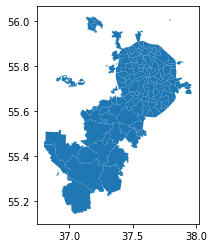

In [201]:
moscow_map = folium.Map([ 55.7522, 37.6156], zoom_start=11)

In [202]:
moscow_map
from folium import plugins, Circle

In [203]:
meg = train[['lat', 'lon']]
moscow_map.add_children(plugins.HeatMap(meg, radius=15))
#тепловая карта расположения объектов на train
#если уменьшить зум, то можно увидеть тепловую карту и для других городов

In [204]:
meg_test = test[['lat', 'lon']]
moscow_map.add_children(plugins.HeatMap(meg_test, radius=15))
#тепловая карта расположения объектов на test

In [205]:
def colorer(t):
    if t >= 3:
        return 'green'
    elif t >= 1.5:
        return 'limegreen'
    elif t >= 1:
        return 'springgreen'
    elif t >= 0.5:
        return 'yellow'
    elif t >= 0:
        return 'orange'
    elif t >= -0.5:
        return 'red'
    else:
        return 'darkred'

In [206]:
mos_map = folium.Map(location=[55.7522, 37.6156], tiles='openstreetmap', zoom_start=11)
for i, row in t1.iterrows():
    Circle(location=[row['lat'], row['lon']], radius=30, color=colorer(t1.iloc[i]['target'])).add_to(mos_map)


In [207]:
mos_map

In [ ]:
#спасибо, очень инетерсная домашка была